In [340]:
#Imports
from src.PCA import ComputeCovariance
from src.dim_red_viz import visualize_manifold_method
#REDO this to just import a function
from src.data.dimensionality_reduction.choose_dimension import choose_dimension
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from rpy2.robjects.packages import importr
import rpy2.robjects as ro
from rpy2.robjects import r, pandas2ri
from sklearn.manifold import Isomap, SpectralEmbedding, LocallyLinearEmbedding
from copy import copy 
from sklearn.manifold import trustworthiness
from kneed import DataGenerator, KneeLocator
from rpy2.robjects.conversion import localconverter

In [280]:
STATE = 'ga'

In [281]:
#Load the data
covid_ga = pd.read_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/raw/covid/stayathome-georgia.csv')
covid_ga_ = covid_ga.set_index('Unnamed: 0')
covid_ga_ = covid_ga_[covid_ga_.columns[:117]] #to consider the same time period with our WA analysis
#Prepare the data: drop nans
X = covid_ga_.dropna().values
index_X = covid_ga_.dropna().index
columns_X = covid_ga_.dropna().columns
X.shape, covid_ga_.shape

((5510, 117), (5519, 117))

In [319]:
#Define functions
import scipy
from datetime import datetime
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import Isomap



def find_closest_time_series(SE_behavior, SE_means, covid_, n = 5):
    """Finds n closest time series to the cluster means (or the vectors in SE_means)
    returns dict with keys V1...V6 cluster names and values dataframes with the n closest samples
    same for block_ids    
    """
    closest_to_mean_samples = {}
    closest_to_mean_block_ids = {}
    for cluster in SE_means.columns:
        sorted_indices = np.squeeze(np.argsort(scipy.spatial.distance.cdist(SE_behavior, SE_means[cluster][None,:], metric='euclidean'), axis = 0))
        closest_to_mean_samples[cluster] = covid_.loc[index_X[sorted_indices[:n]]] #Take the closest n points
        closest_to_mean_block_ids[cluster] = index_X[sorted_indices[:n]]
    return closest_to_mean_samples, closest_to_mean_block_ids


def plot_time_series(time_series_df, name = 'time_series_of_interest', filename = None, only_melt = False):
    FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    time_series_df_ = time_series_df.copy().T
    time_series_df_['dates'] = pd.to_datetime(time_series_df.columns)
    #closest_to_mean_sample_ = closest_to_mean_sample.T
    #closest_to_mean_sample_['dates'] = pd.to_datetime(columns_X)
#     closest_to_mean_sample_
    #Cluster means figure
    sns.set(style="darkgrid")
    melted_df = pd.melt(time_series_df_,
                        id_vars=['dates'], # Variables to keep
                        var_name="Block")
    if only_melt:
        return melted_df
    g = sns.relplot(x = 'dates', y="value", row = 'Block', 
                    kind="line", row_order=time_series_df.index, data=melted_df, sort = False, aspect = 5, marker='o')
    g.fig.autofmt_xdate(0,10)
    plt.subplots_adjust(top=0.93)
    g.fig.suptitle(name, size = 'xx-large')
    g.set(ylim=(0, 1))


    #Add the important dates
    # ax = g.axes[1]

    for axs in g.axes:
        axs[0].axvline(datetime(2020, 2, 29), color = 'green', ls='--', label='emergency_WA')
        axs[0].axvline(datetime(2020, 3, 3), color = 'blue', ls='--', label='emergency_Seattle')
        axs[0].axvline(datetime(2020, 3, 11), color = 'red', ls='--', label='events_ban')
        axs[0].axvline(datetime(2020, 3, 12), color = 'brown', ls='--', label='schools')
        axs[0].axvline(datetime(2020, 3, 15), color = 'green', ls='-', label='restrautrants')
        axs[0].axvline(datetime(2020, 3, 21), color = 'blue', ls='-', label='Everett_stay_home')
        axs[0].axvline(datetime(2020, 3, 23), color = 'red', ls='-', label='stay-at-home')
        axs[0].axvline(datetime(2020, 3, 25), color = 'brown', ls='-', label='WA_parks_closed')
        axs[0].axvline(datetime(2020, 3, 31), color = 'green', ls='-.', label='National_guard_WA')
        axs[0].axvline(datetime(2020, 4, 2), color = 'blue', ls='-.', label='stay-at-home_extended')

        axs[0].legend()

    # ax[0].text(0.5,25, "Some text")
    if filename is not None:
        g.fig.savefig(FIGURES_PATH+filename, bbox_inches = 'tight')
    
    return melted_df
        
def viz_blocks_on_the_map(block_ids, name = 'blocks_of_interest', filename = None):#, washington_ = washington_):
    FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    washington = gpd.read_file('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/external/washington_blockgroup_shape/tl_2015_53_bg/tl_2015_53_bg.shp')
#     washington_ = washington.copy()
#     washington_.GEOID = washington_.GEOID.astype('int')
#     washington_ = washington_.set_index('GEOID')
    washington['blocks_of_interest'] = False
    washington['blocks_of_interest'][washington.GEOID.astype('int').isin(block_ids.astype('int'))] = True
#     colors = pd.DataFrame(colors, columns = ['c'])
#     colors['block_ind'] = index_X
#     colors = colors.set_index('block_ind')
#     washington_['colormap'] = colors['c']
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('off')
    washington.plot(column = 'blocks_of_interest', ax = ax, legend = False, edgecolor="face", cmap = 'OrRd',
                    linewidth=0.4, legend_kwds={'label': 'Cluster','orientation': "horizontal"})
    ax.set(title=name)
    if filename is not None:
        fig.savefig(FIGURES_PATH+filename, bbox_inches = 'tight')
        
def viz_SE(X, colors, filename = None, alpha = None, subselect = slice(None)): 
    #Try Spectral Embedding
    from sklearn.manifold import SpectralEmbedding

    emb_method = SpectralEmbedding

    hyperparams_to_test = {}#{'n_neighbors': [50, 50]}
#     colors = colors#labels_multirun['Labels_3']#SE_clusters['x'].values
    SE_X_2D_emb, SE_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors, '', filename = filename, alpha = alpha, subselect = subselect, **{'n_neighbors': 50,
     'n_components': 2,
     'n_jobs': -1})
    
    return SE_X_2D_emb, SE_X_3D_emb


        
def viz_Isomap(X, colors, filename = None, alpha = None, subselect = slice(None)):
    emb_method = Isomap
    hyperparams_to_test = {}#{'n_neighbors': [50, 50]}
#     colors = colors#SE_clusters['x'].values#lusters[:,1]

    Isomap_X_2D_emb, Isomap_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors,
                              '', filename = filename, 
                              alpha = alpha, subselect = subselect, **{'n_neighbors': 50, 
                                                                    'n_components': 2, 
                                                                    'max_iter': 1000, 
                                                                    'n_jobs': -1})
    return Isomap_X_2D_emb, Isomap_X_3D_emb
    
def viz_LLE(X, colors, filename = None, alpha = None, subselect = slice(None)):
    #Try LLE, standard, tweaked parameters a little
    from sklearn.manifold import LocallyLinearEmbedding

    emb_method = LocallyLinearEmbedding
    hyperparams_to_test = {}#'n_neighbors': [200, 200],
    # colors = clusters[:,1]


    LLE_X_2D_emb, LLE_X_3D_emb = visualize_manifold_method(X, emb_method, hyperparams_to_test, colors,
                              '', filename = filename, 
                              alpha = alpha, subselect = subselect, **{'n_neighbors': 200,
                                                                       'n_components': 2,
                                                                       'reg': 0.1,
                                                                       'eigen_solver': 'auto',
                                                                       'tol': 1e-06,
                                                                       'max_iter': 1000,
                                                                       'method': 'standard',
                                                                       'hessian_tol': 0.0001,
                                                                       'modified_tol': 1e-12,
                                                                       'neighbors_algorithm': 'auto',  
                                                                       'random_state': None,
                                                                       'n_jobs': -1})
    return LLE_X_2D_emb, LLE_X_3D_emb
    
    
def viz_cluster_map(colors, index_X, filename = None):#, washington_ = washington_):
    FIGURES_PATH = '/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/reports/figures/'
    #FIX THIS FOR OTHER STATES!
    washington = gpd.read_file('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/external/georgia_blockgroup_shape/tl_2017_13_bg.shp')
    washington_ = washington.copy()
    washington_.GEOID = washington_.GEOID.astype('int')
    washington_ = washington_.set_index('GEOID')
    
    colors = pd.DataFrame(colors, columns = ['c'])
    colors['block_ind'] = index_X
    colors = colors.set_index('block_ind')
    washington_['colormap'] = colors['c']
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('off')
    washington_.plot(column = 'colormap', ax = ax, legend = True, edgecolor="face", linewidth=0.4, legend_kwds={'label': 'Cluster','orientation': "horizontal"})
    ax.set(title='GMM Clustering')
    if filename is not None:
        fig.savefig(FIGURES_PATH + filename, bbox_inches = 'tight')

        
def create_walk_df(X_emb, similarity, index):
    """X_emb -- embedding,
    similarity -- to sort by in the walk, colormap, the same dimension with X_emb
    index -- non-artifact index e.g., to subselect
    """
    similarities_non_artifact = similarity[index]
    X_walk = X_emb[index]
    X_walk_df = pd.DataFrame(X_walk, columns = ['Mode_{}'.format(i) for i in range(X_walk.shape[1])])
    X_walk_df['Similarity'] = similarities_non_artifact
    return X_walk_df.sort_values(by = 'Similarity')#.reset_index(drop = True)

def find_cos_similarity(X_2D_emb):
    right_end = X_2D_emb[np.argmax(X_2D_emb, axis = 0)[0]]
    left_end = X_2D_emb[np.argmin(X_2D_emb, axis = 0)[0]]
    left_end, right_end, np.argmin(X_2D_emb, axis = 0)[0]
    center = (left_end + right_end)/2
    cosine_colors = 1-cosine_similarity([right_end - center], X_2D_emb-center, dense_output=True).flatten()
    return cosine_colors

In [7]:
def return_metric(method, model):
    if method.__name__ == 'Isomap':
        return model.reconstruction_error()
    if method.__name__ == 'TSNE':
        return None # TODO
    return None
    #TODO other methods too

### Choose optimal dimensionality using Isomap, SE and LLE

In [292]:
%%time
#Let's try isomap first
#The best parameters from the vizualization are taken from previous analysis: 50 neighbors
#let's try several n_components
emb_method = Isomap
# hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
# # colors = covid_clusters['x'].copy()

# errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
#                                                                              'n_components': 2, 
#                                                                              'max_iter': 1000,
#                                                                              'n_jobs': -1})
hyperparams_to_test = {'n_components': [16]}
# colors = covid_clusters['x'].copy()

errors_results, embeddings_results, trustws_results = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50, 
                                                                             'n_components': 2, 
                                                                             'max_iter': 10,
                                                                             'n_jobs': -1})

#UNCOMMENT THE ABOVE

here
Trying n_components=16
CPU times: user 1min 47s, sys: 3.95 s, total: 1min 51s
Wall time: 56.8 s


In [293]:
embeddings_results['n_components'][0].shape

(5510, 16)

<IPython.core.display.Javascript object>


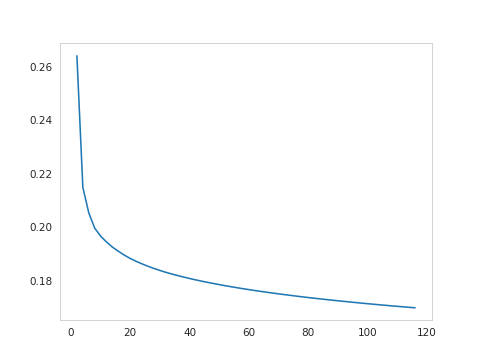

In [36]:
%matplotlib notebook
#Look at the errors Isomap gives
plt.plot(np.arange(2, 117, 2), errors_results['n_components'])

<IPython.core.display.Javascript object>


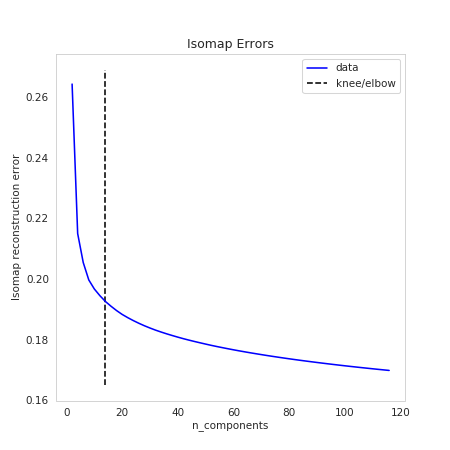

14

In [56]:
# x, y = enumerate(errors['n_components'])
%matplotlib notebook
kneedle = KneeLocator(np.arange(2, 117, 2), errors_results['n_components'], S=1.0, curve='convex', direction='decreasing')#, interp_method='polynomial')\
kneedle.plot_knee()
plt.title(emb_method.__name__ + ' Errors')
plt.xlabel('n_components')
plt.ylabel('Isomap reconstruction error')
kneedle.elbow

<IPython.core.display.Javascript object>


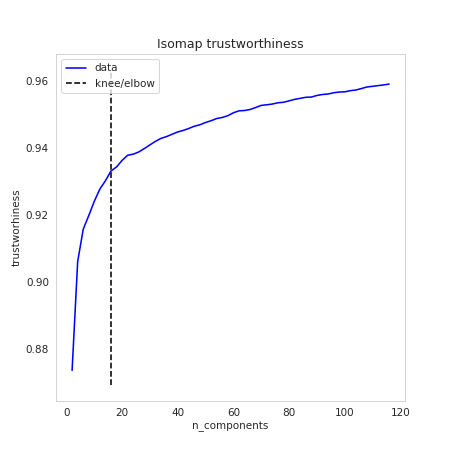

(16, 0.933117415989965)

In [54]:
kneedle = KneeLocator(np.arange(2, 117, 2), np.array(trustws_results['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [67]:
#UNCOMMENT THIS!
# #Save the dataframe with optimal dim
# good_dim = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_isomap = embeddings_results['n_components'][good_dim] #pick the best (knee point) n_components
# X_isomap_df = pd.DataFrame(X_isomap, columns = ['Mode {}'.format(i) for i in range(X_isomap.shape[1])])#, index = index_X)
# X_isomap_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/Isomap_'+ str(X_isomap.shape[1])+ 'D_' + STATE + '.csv')
# X_isomap_df.shape

(5508, 16)

In [295]:
#Save the dataframe with optimal dim
# good_dim = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_isomap = embeddings_results['n_components'][0] #pick the best (knee point) n_components
X_isomap_df = pd.DataFrame(X_isomap, columns = ['Mode {}'.format(i) for i in range(X_isomap.shape[1])])#, index = index_X)
X_isomap_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/Isomap_'+ str(X_isomap.shape[1])+ 'D_' + STATE + '.csv')
X_isomap_df.shape

(5510, 16)

In [296]:
%%time
#Let's try Spectral Emdedding, will use trustworhiness to see how much local structure is retained
#The best parameters from the vizualization seem to be maybe 50 neighbors, let's try several n_components
emb_method = SpectralEmbedding
# hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
# # colors = covid_clusters['x'].copy()

# errors_results_SE, embeddings_results_SE, trustws_results_SE = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50,
#  'n_components': 2,
#  'n_jobs': -1})

#UNCOMMENT THE ABOVE!!!
hyperparams_to_test = {'n_components': [14]}
# colors = covid_clusters['x'].copy()

errors_results_SE, embeddings_results_SE, trustws_results_SE = choose_dimension(X, emb_method, hyperparams_to_test, '', **{'n_neighbors': 50,
 'n_components': 2,
 'n_jobs': -1})

here
Trying n_components=14
CPU times: user 20.7 s, sys: 1.95 s, total: 22.7 s
Wall time: 8.78 s


<IPython.core.display.Javascript object>


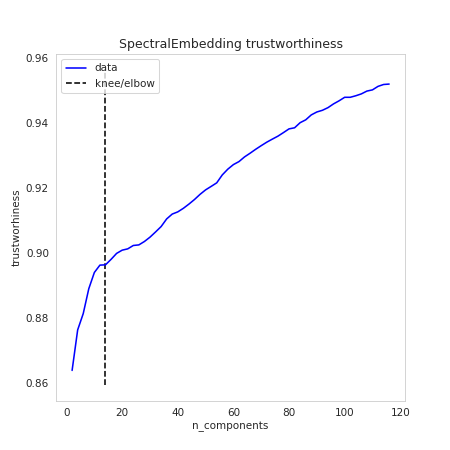

(14, 0.89634814860262)

In [63]:
kneedle = KneeLocator(np.arange(2, 117, 2), np.array(trustws_results_SE['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [69]:
# #Save the dataframe with optimal dim
# good_dim_SE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_SE = embeddings_results['n_components'][good_dim_SE] #pick the best (knee point) n_components
# X_SE_df = pd.DataFrame(X_SE, columns = ['Mode {}'.format(i) for i in range(X_SE.shape[1])])#, index = index_X)
# X_SE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/SE_' + str(X_SE.shape[1]) + 'D_' + STATE + '.csv')
# X_SE_df.shape

(5508, 14)

In [302]:
#Save the dataframe with optimal dim
# good_dim_SE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_SE = embeddings_results_SE['n_components'][0] #pick the best (knee point) n_components
X_SE_df = pd.DataFrame(X_SE, columns = ['Mode {}'.format(i) for i in range(X_SE.shape[1])])#, index = index_X)
X_SE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/SE_' + str(X_SE.shape[1]) + 'D_' + STATE + '.csv')
X_SE_df.shape

(5510, 14)

In [300]:
%%time
#Let's try Spectral Emdedding, will use trustworhiness to see how much local structure is retained
#The best parameters from the vizualization seem to be maybe 50 neighbors, let's try several n_components
emb_method = LocallyLinearEmbedding
# hyperparams_to_test = {'n_components': np.arange(2, 117, 2)}
# # colors = covid_clusters['x'].copy()

# errors_results_LLE, embeddings_results_LLE, trustws_results_LLE  = choose_dimension(X, emb_method, hyperparams_to_test, '',**{'n_neighbors': 200,
#  'n_components': 2,
#  'reg': 0.1, #Note here that we later ended up using reg 0.1, so setting it
#  'eigen_solver': 'auto',
#  'tol': 1e-06,
#  'max_iter': 1000,
#  'method': 'standard',
#  'hessian_tol': 0.0001,
#  'modified_tol': 1e-12,
#  'neighbors_algorithm': 'auto',
#  'random_state': None,
#  'n_jobs': -1})

#Uncomment the above!!!
hyperparams_to_test = {'n_components': [14]}
# colors = covid_clusters['x'].copy()

errors_results_LLE, embeddings_results_LLE, trustws_results_LLE  = choose_dimension(X, emb_method, hyperparams_to_test, '',**{'n_neighbors': 200,
 'n_components': 2,
 'reg': 0.1, #Note here that we later ended up using reg 0.1, so setting it
 'eigen_solver': 'auto',
 'tol': 1e-06,
 'max_iter': 1000,
 'method': 'standard',
 'hessian_tol': 0.0001,
 'modified_tol': 1e-12,
 'neighbors_algorithm': 'auto',
 'random_state': None,
 'n_jobs': -1})

here
Trying n_components=14
CPU times: user 1min 33s, sys: 4.22 s, total: 1min 37s
Wall time: 28.5 s


<IPython.core.display.Javascript object>


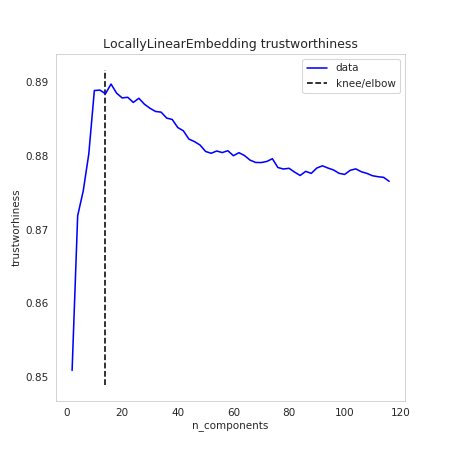

(14, 0.8884464847298557)

In [73]:
kneedle = KneeLocator(np.arange(2, 117, 2), np.array(trustws_results_LLE['n_components']), S=1, curve='concave', direction='increasing', interp_method='polynomial')
kneedle.plot_knee()
plt.title(emb_method.__name__  + ' trustworthiness')
plt.xlabel('n_components')
plt.ylabel('trustworhiness')
kneedle.knee, kneedle.knee_y

In [74]:
# #Save the dataframe with optimal dim
# good_dim_LLE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
# X_LLE = embeddings_results['n_components'][good_dim_LLE] #pick the best (knee point) n_components
# X_LLE_df = pd.DataFrame(X_LLE, columns = ['Mode {}'.format(i) for i in range(X_LLE.shape[1])])#, index = index_X)
# X_LLE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/LLE_' + str(X_LLE.shape[1]) + 'D_' + STATE + '.csv')
# X_LLE_df.shape

(5508, 14)

In [303]:
# good_dim_LLE = int(np.squeeze(np.where(hyperparams_to_test['n_components'] == kneedle.knee)))
X_LLE = embeddings_results_LLE['n_components'][0] #pick the best (knee point) n_components
X_LLE_df = pd.DataFrame(X_LLE, columns = ['Mode {}'.format(i) for i in range(X_LLE.shape[1])])#, index = index_X)
X_LLE_df.to_csv('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/interim/LLE_' + str(X_LLE.shape[1]) + 'D_' + STATE + '.csv')
X_LLE_df.shape

(5510, 14)

## Visualize SE, Isomap, LLE

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


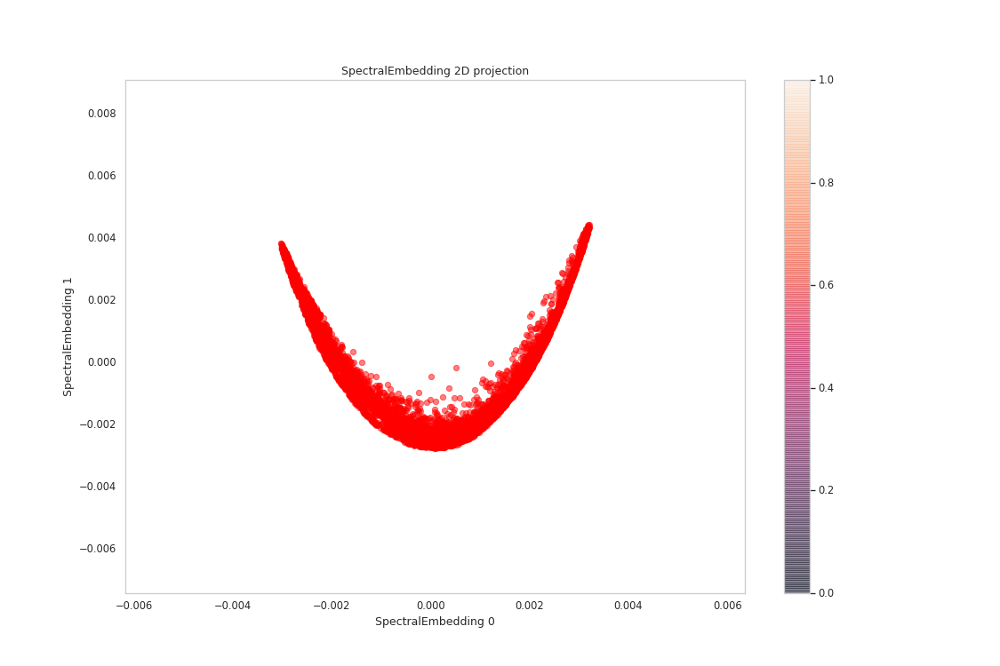

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


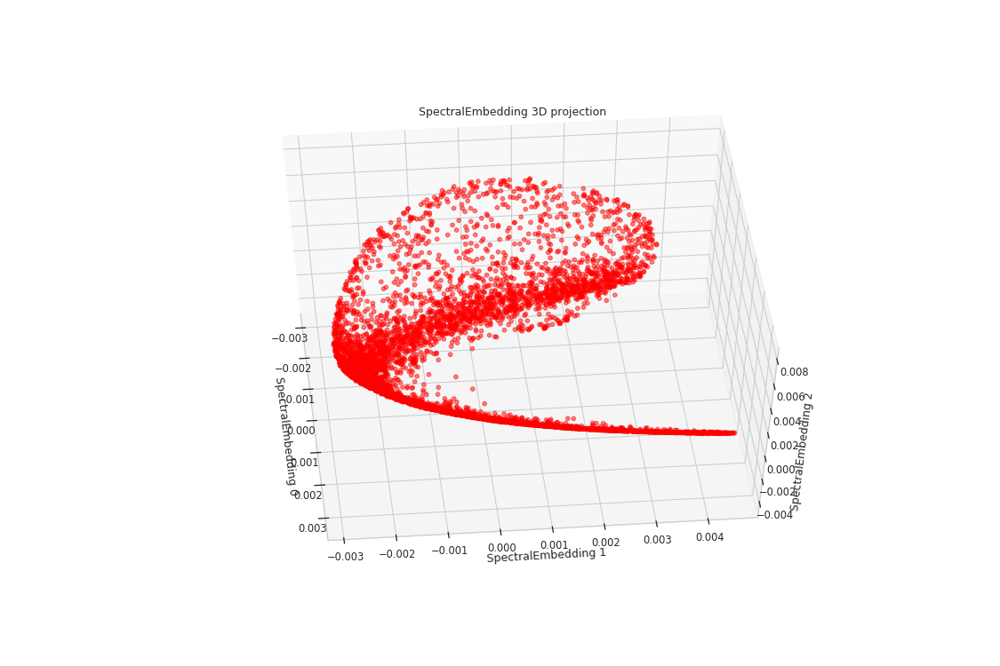

3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


In [305]:
#Viz clustering on the emb
# filename_SE_clustering = FIGURES_ADDITIONAL_PATH + 'clustering'
# %%matplotlib notebook
_ = viz_SE(X, 'red', filename = None, alpha = 0.5)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


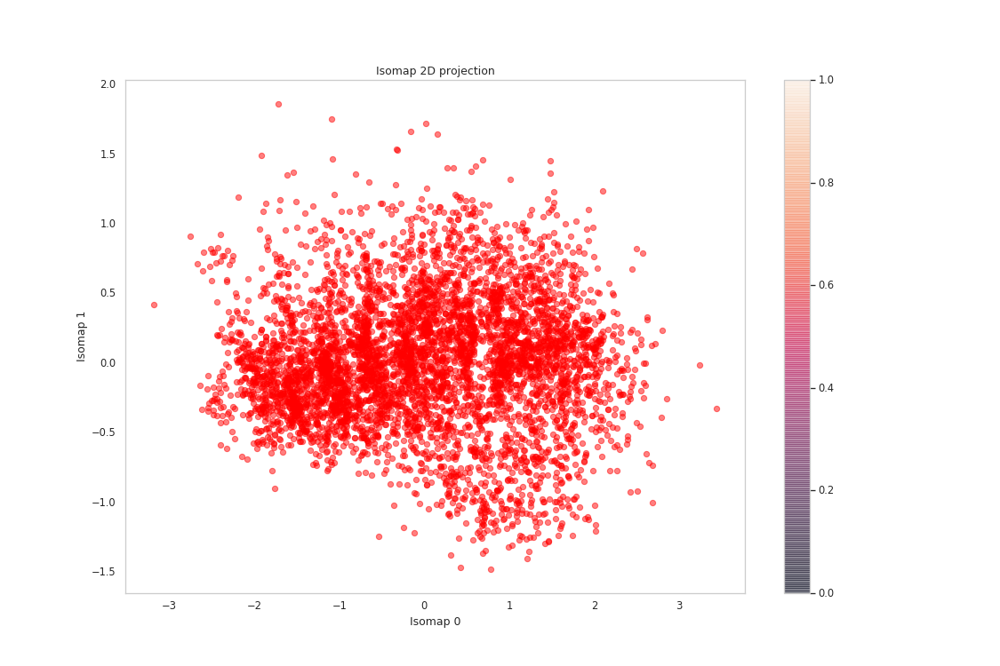

2D Args: {'n_neighbors': 50, 'n_components': 2, 'max_iter': 1000, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


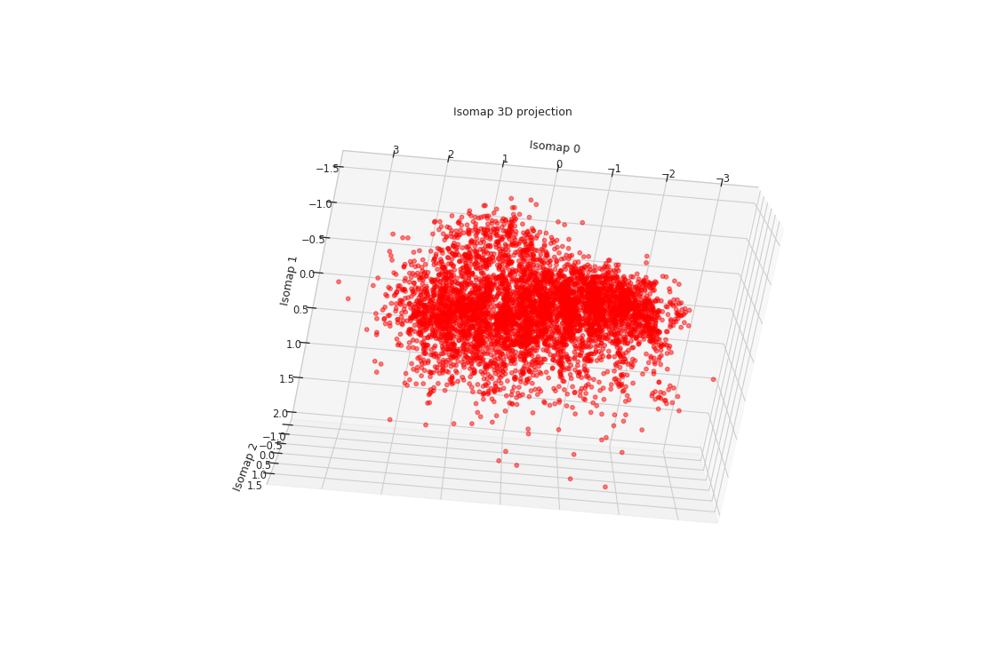

3D Args: {'n_neighbors': 50, 'n_components': 3, 'max_iter': 1000, 'n_jobs': -1}


In [306]:
_ = viz_Isomap(X, 'red', filename = None, alpha = 0.5)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


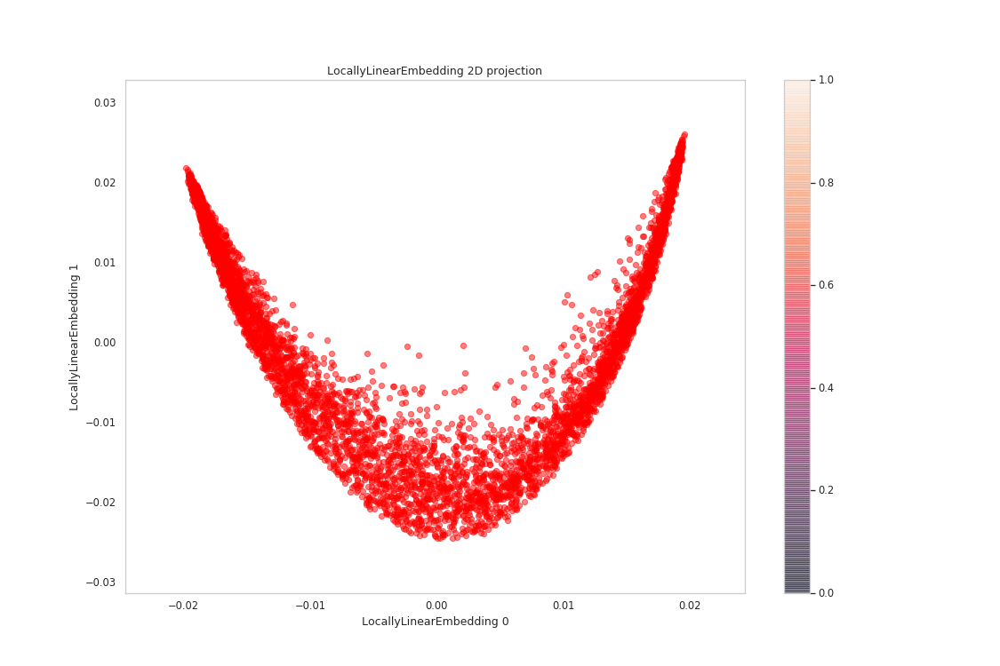

2D Args: {'n_neighbors': 200, 'n_components': 2, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


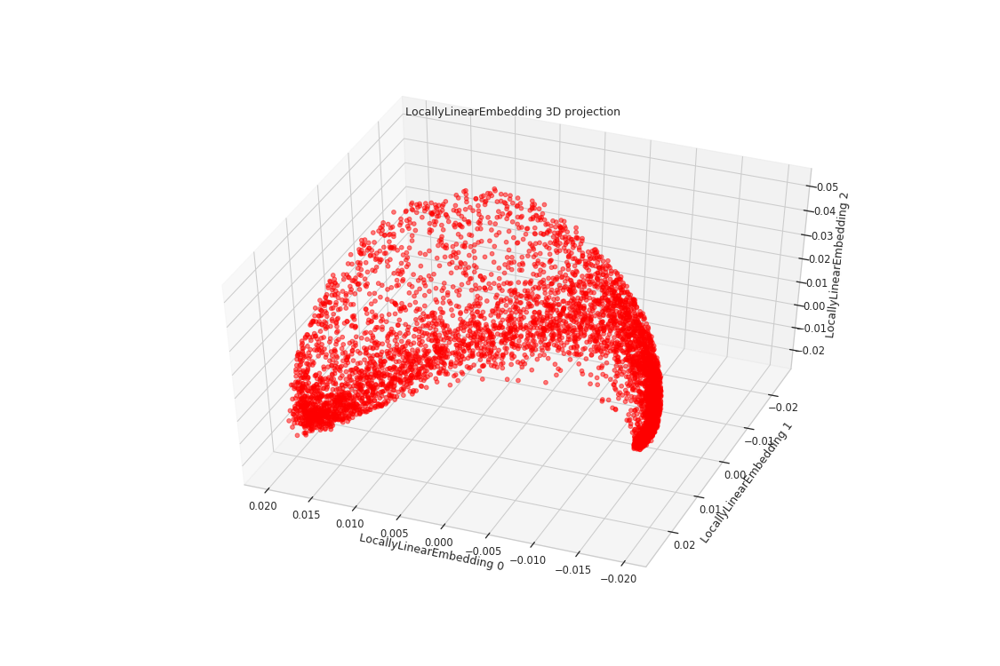

3D Args: {'n_neighbors': 200, 'n_components': 3, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


In [308]:
_ = viz_LLE(X, 'red', filename = None, alpha = 0.5)

## GMM clustering in R

In [309]:
# ro.r('install.packages("mclust")')
base = importr('base')
mclust = importr('mclust')
ro.r('set.seed(0)')

<rpy2.rinterface_lib.sexp.NULLType object at 0x7f07922bb5f0> [RTYPES.NILSXP]

In [311]:
with localconverter(ro.default_converter + pandas2ri.converter):
#     BIC = mclust.mclustBIC(X_SE_df, G = pd.Series(np.arange(1,12)))
    mc = mclust.Mclust(X_SE_df, G = pd.Series(np.arange(1,6)))
    print(base.summary(mc))
    print(np.quantile(mc[15], [0, 0.25, 0.5, 0.75, 1]))
    SE_clusters = np.array(mc[14])
    SE_means = np.array(mc[12][1])

fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 5
components: 

 log-likelihood    n  df     BIC     ICL
       555246.8 5510 599 1105334 1105307

Clustering table:
   1    2    3    4    5 
 960 1177 1577  647 1149 

[0.00000000e+00 0.00000000e+00 0.00000000e+00 4.38538095e-14
 4.92285983e-01]


In [312]:
with localconverter(ro.default_converter + pandas2ri.converter):
#     BIC = mclust.mclustBIC(X_SE_df, G = pd.Series(np.arange(1,12)))
    mc = mclust.Mclust(X_isomap_df, G = pd.Series(np.arange(1,6)))
    print(base.summary(mc))
    print(np.quantile(mc[15], [0, 0.25, 0.5, 0.75, 1]))
    isomap_clusters = np.array(mc[14])
    isomap_means = np.array(mc[12][1])

fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 5
components: 

 log-likelihood    n  df      BIC      ICL
        51592.7 5510 764 96604.06 96262.46

Clustering table:
   1    2    3    4    5 
1012 1172  816 1765  745 

[0.00000000e+00 2.11358242e-09 6.13489578e-06 2.27182667e-03
 6.23758342e-01]


In [313]:
with localconverter(ro.default_converter + pandas2ri.converter):
#     BIC = mclust.mclustBIC(X_SE_df, G = pd.Series(np.arange(1,12)))
    mc = mclust.Mclust(X_LLE_df, G = pd.Series(np.arange(1,6)))
    print(base.summary(mc))
    print(np.quantile(mc[15], [0, 0.25, 0.5, 0.75, 1]))
    LLE_clusters = np.array(mc[14])
    LLE_means = np.array(mc[12][1])

fitting ...
  |======================================================================| 100%
---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVV (ellipsoidal, varying volume, shape, and orientation) model with 5
components: 

 log-likelihood    n  df    BIC      ICL
       362219.5 5510 599 719279 719212.9

Clustering table:
   1    2    3    4    5 
1075 1552  790 1211  882 

[0.00000000e+00 0.00000000e+00 0.00000000e+00 9.38661371e-11
 5.77575916e-01]


### Interpretability: Centroids, Map, Embedding

In [314]:
#Start with LLE
LLE_means = pd.DataFrame(LLE_means, columns = ['V'+str(i+1) for i in range(LLE_means.shape[1])])
LLE_means

,V1,V2,V3,V4,V5
0,0.012782,-0.016377,-0.005670,0.000183,0.018071
1,-0.003718,0.008990,-0.005079,-0.017058,0.016756
2,-0.005789,0.001066,-0.000207,-0.000454,0.006005
3,0.013774,0.003426,-0.009189,-0.003528,-0.009722
4,-0.008196,-0.002483,-0.002927,0.010333,0.002809
5,0.000906,0.000475,-0.003469,-0.000533,0.001917
6,-0.000225,-0.002778,0.013418,-0.003723,-0.001807
7,0.004558,0.004093,-0.004370,-0.003115,-0.004551
8,0.002115,-0.000973,0.006732,-0.003811,-0.001695
9,0.000791,-0.001181,0.009280,-0.003081,-0.003013


In [315]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/GA/'
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_LLE_df, LLE_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


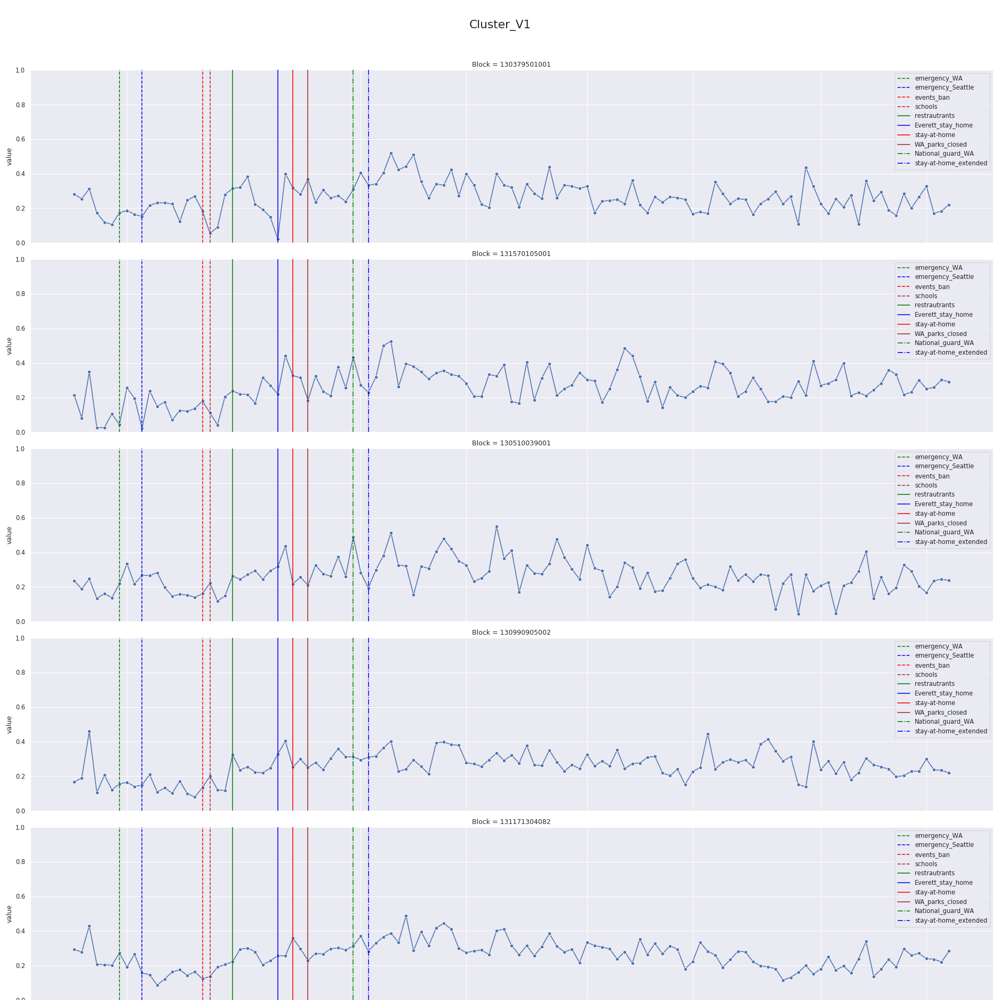

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


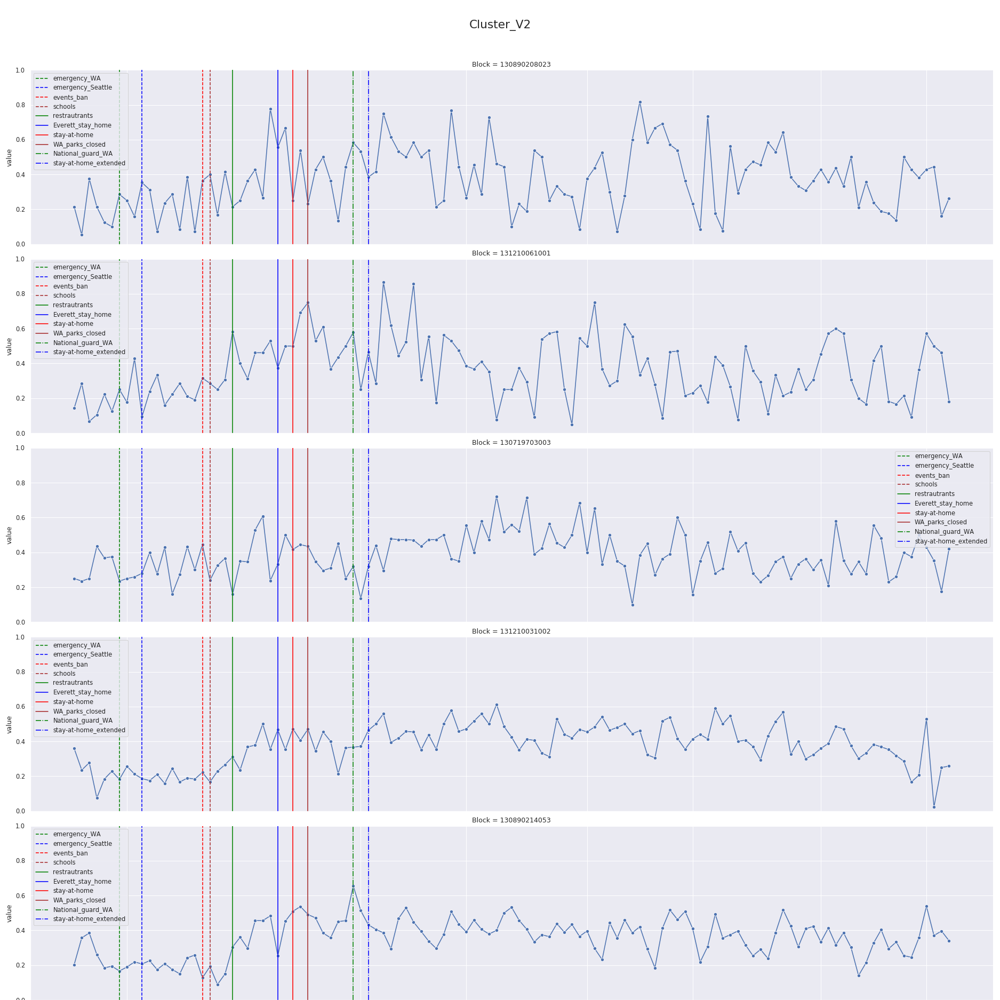

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


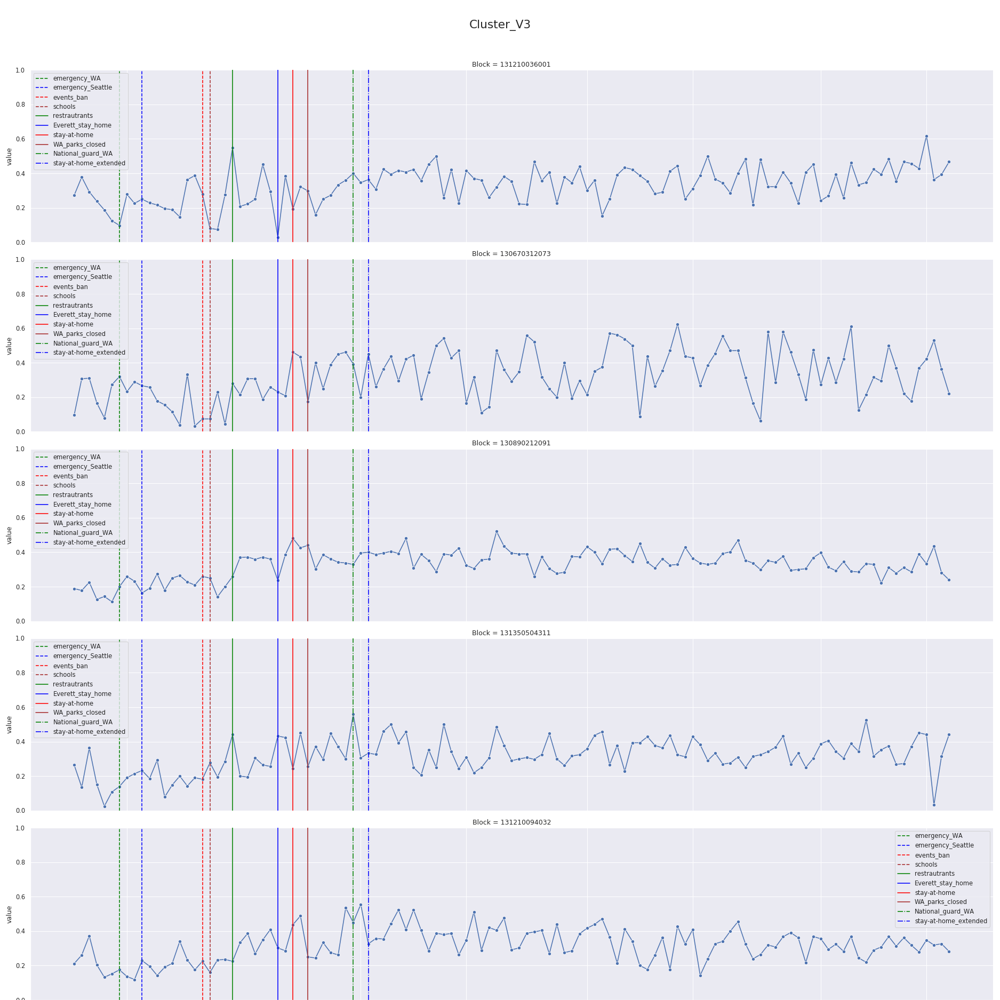

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


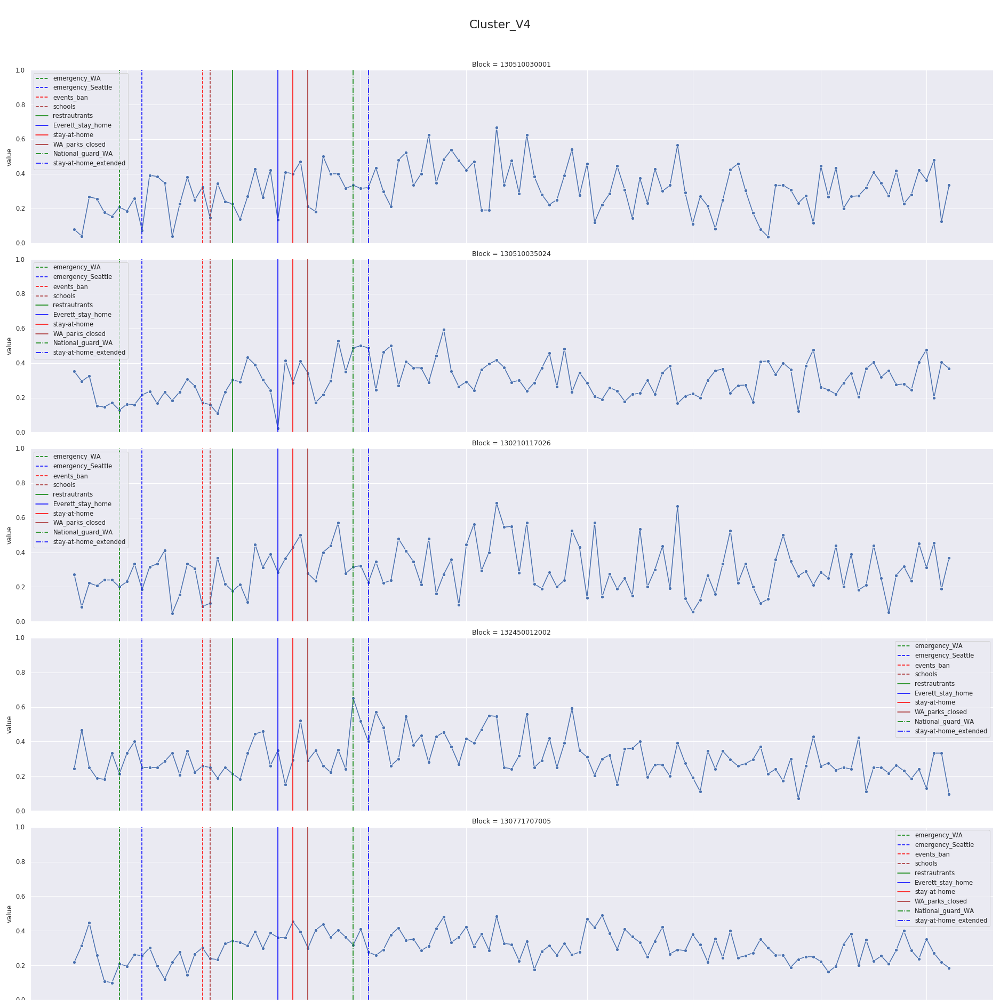

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


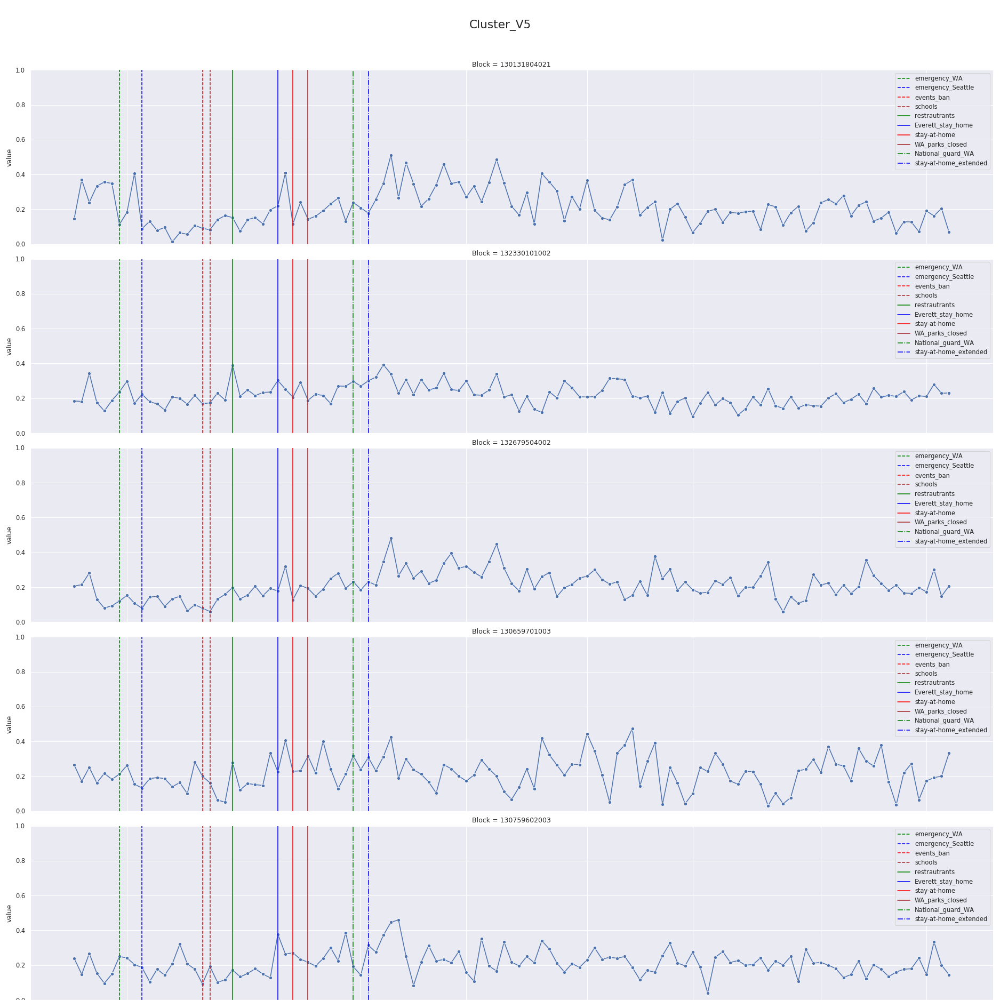

In [316]:
#Look at the closest time series
for cluster in LLE_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'LLE_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


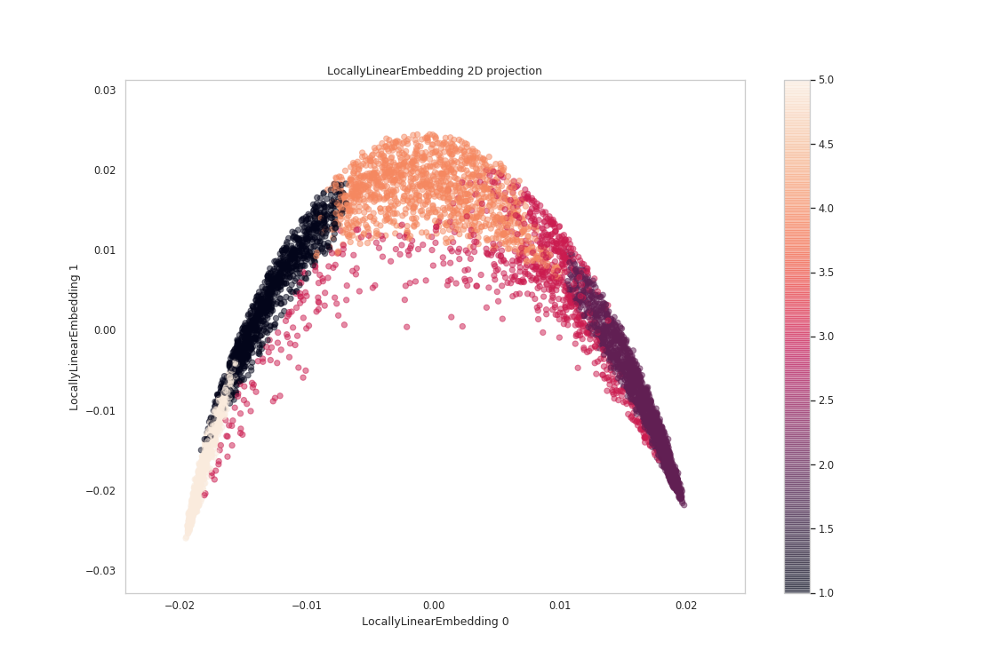

2D Args: {'n_neighbors': 200, 'n_components': 2, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


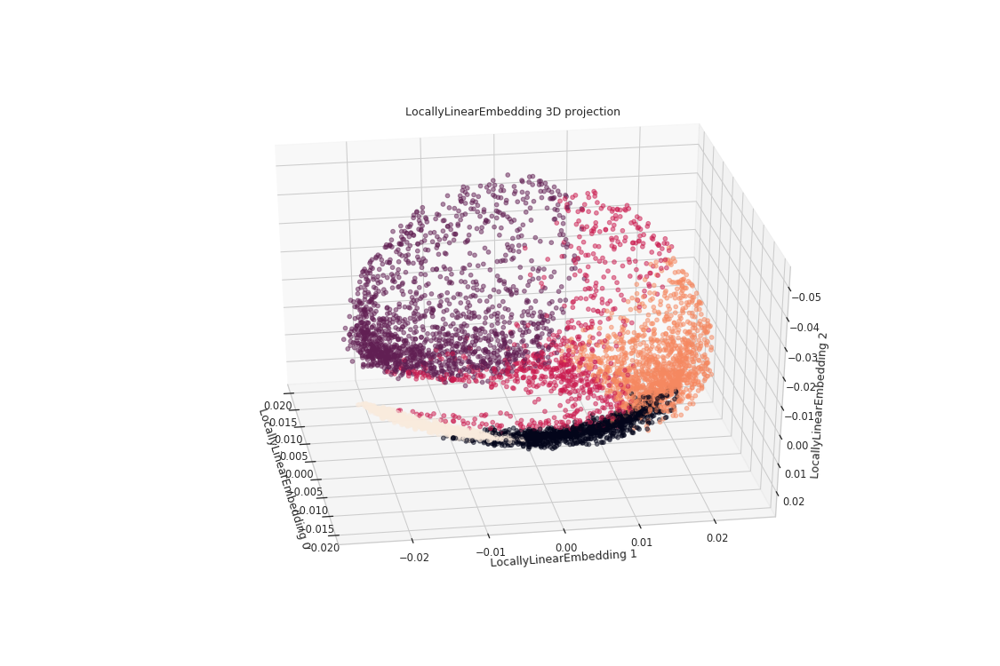

3D Args: {'n_neighbors': 200, 'n_components': 3, 'reg': 0.1, 'eigen_solver': 'auto', 'tol': 1e-06, 'max_iter': 1000, 'method': 'standard', 'hessian_tol': 0.0001, 'modified_tol': 1e-12, 'neighbors_algorithm': 'auto', 'random_state': None, 'n_jobs': -1}


In [317]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_LLE_clustering = FIGURES_ADDITIONAL_PATH + 'LLE_clustering'
_ = viz_LLE(X, LLE_clusters, filename = filename_LLE_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:155: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


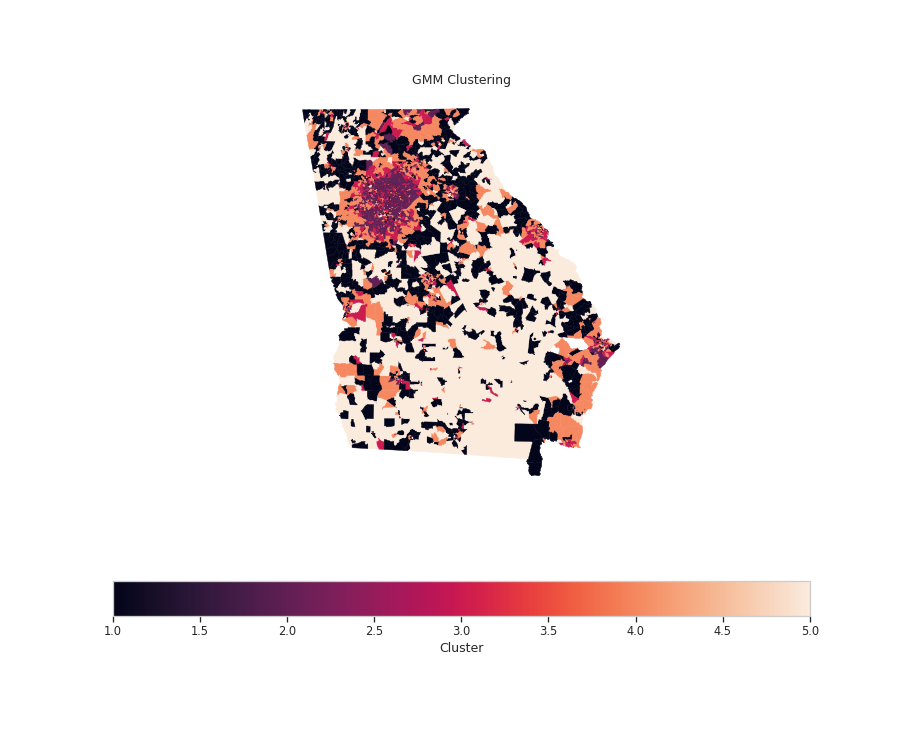

In [320]:
# #Viz clustering on the map
filename_LLE_clustering_map = FIGURES_ADDITIONAL_PATH + 'LLE_clustering_map'
viz_cluster_map(LLE_clusters, index_X, filename = filename_LLE_clustering_map)

In [322]:
#Now Isomap
isomap_means = pd.DataFrame(isomap_means, columns = ['V'+str(i+1) for i in range(isomap_means.shape[1])])
# isomap_means

In [323]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/GA/'
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_isomap_df, isomap_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


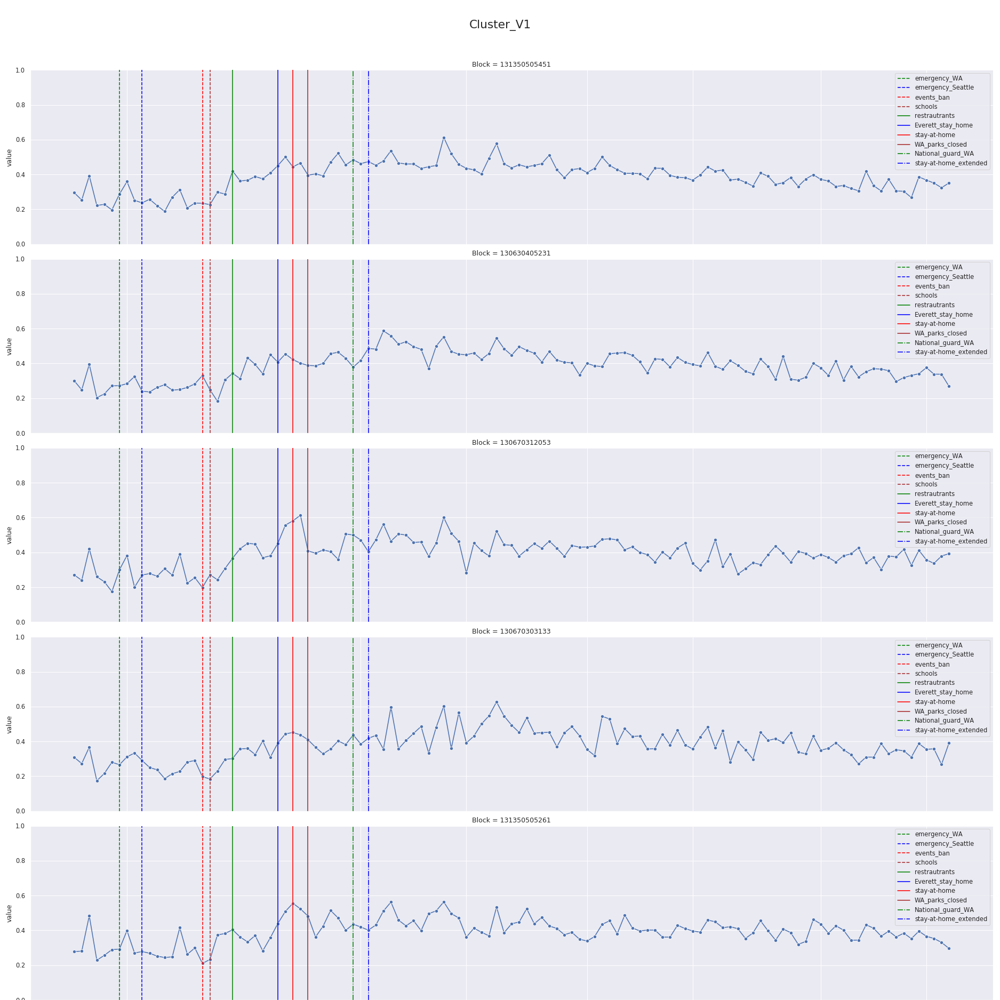

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


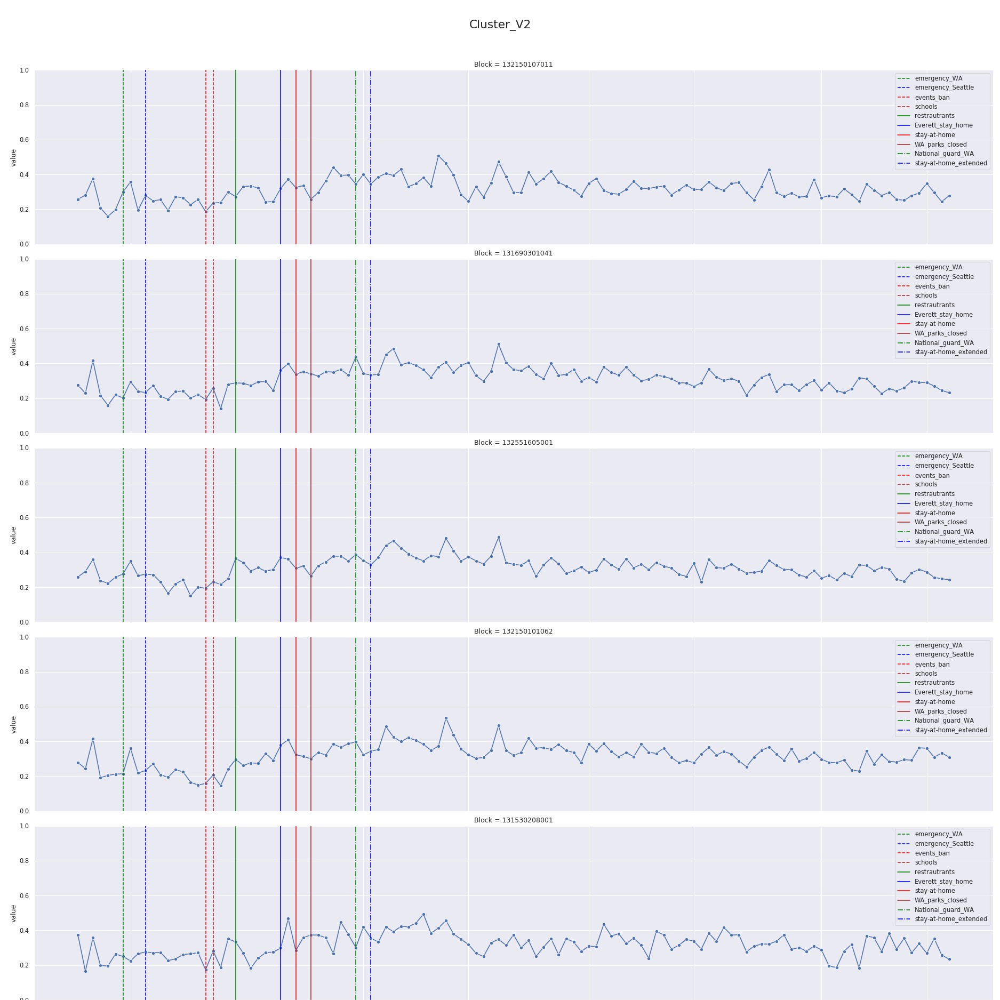

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


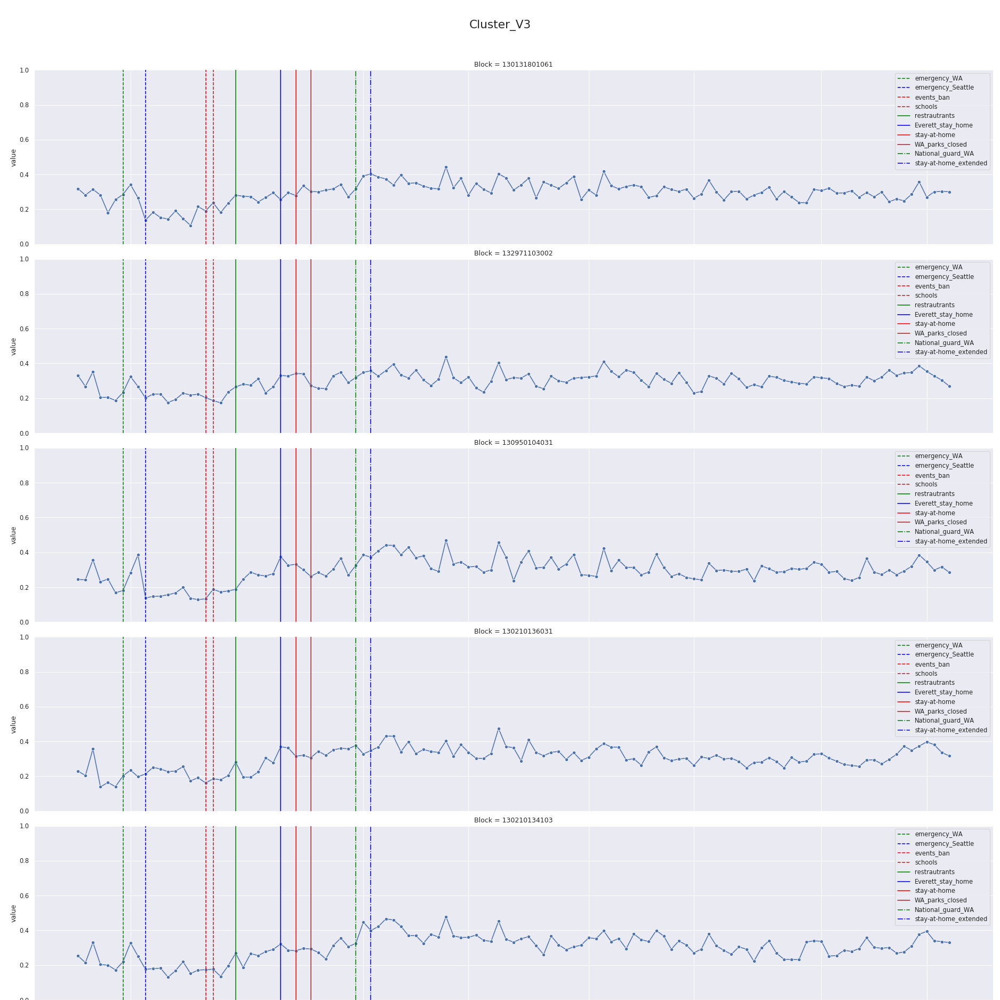

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


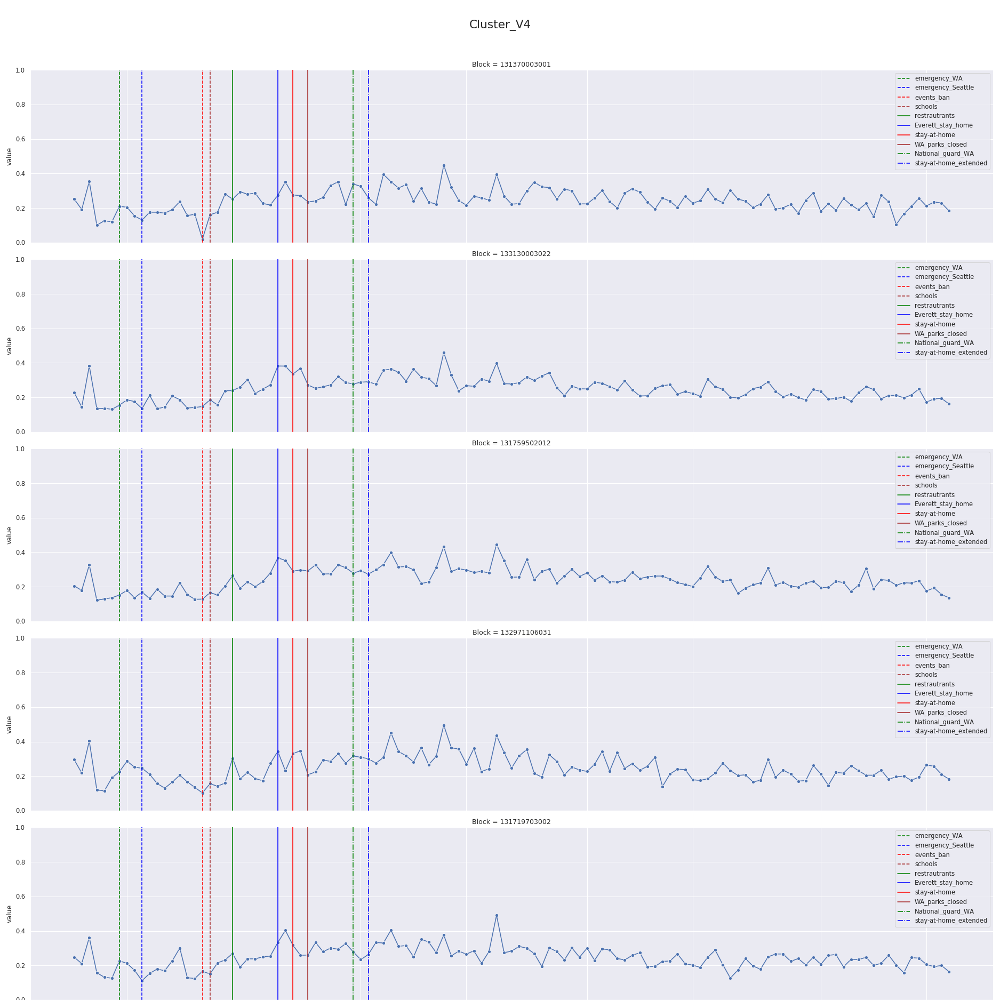

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


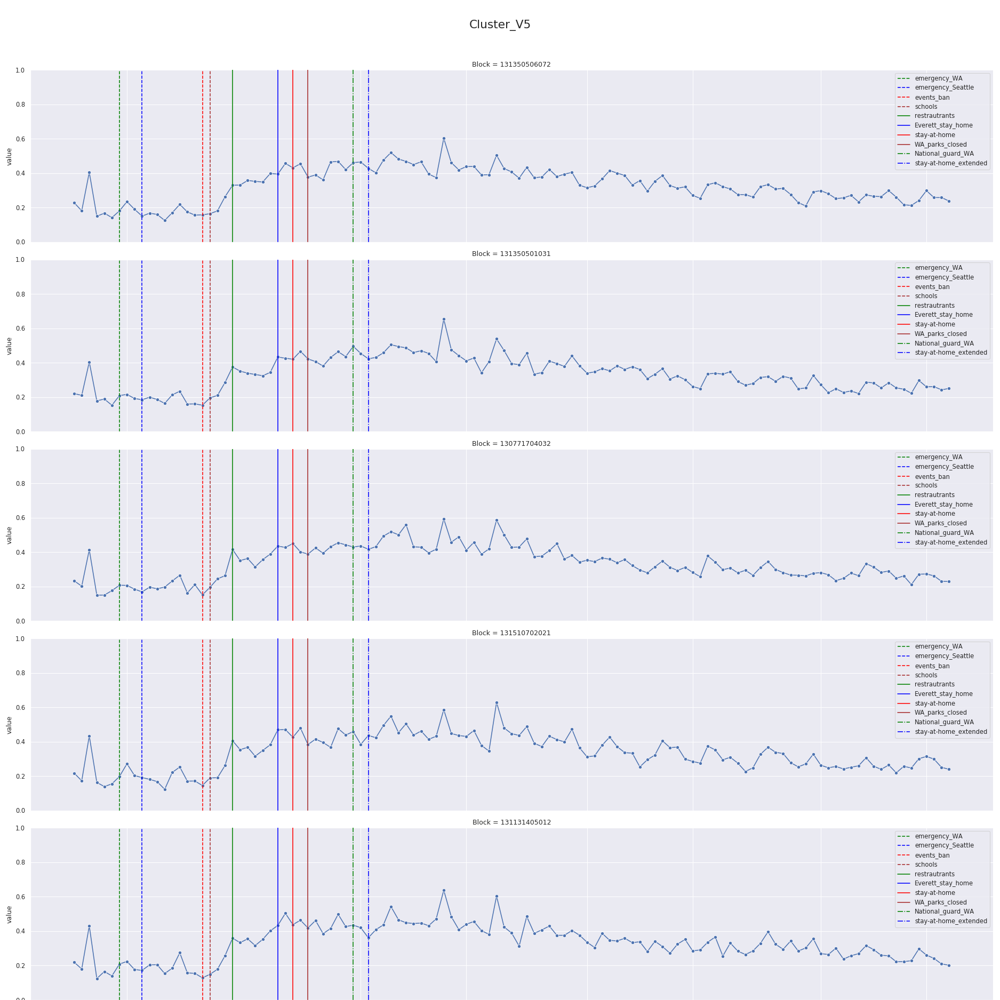

In [324]:
#Look at the closest time series
for cluster in isomap_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'isomap_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


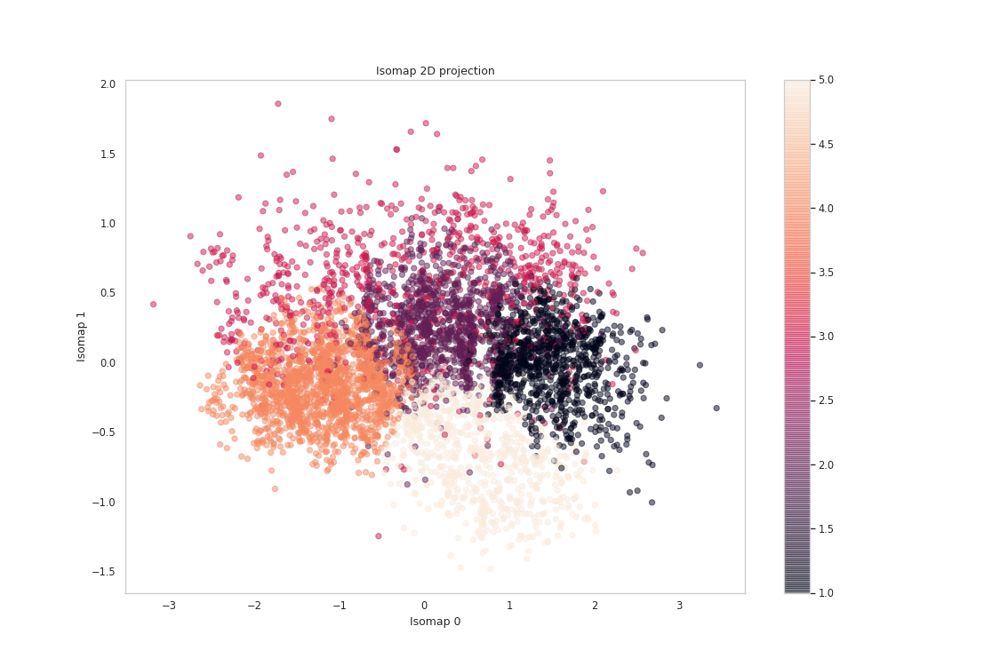

2D Args: {'n_neighbors': 50, 'n_components': 2, 'max_iter': 1000, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


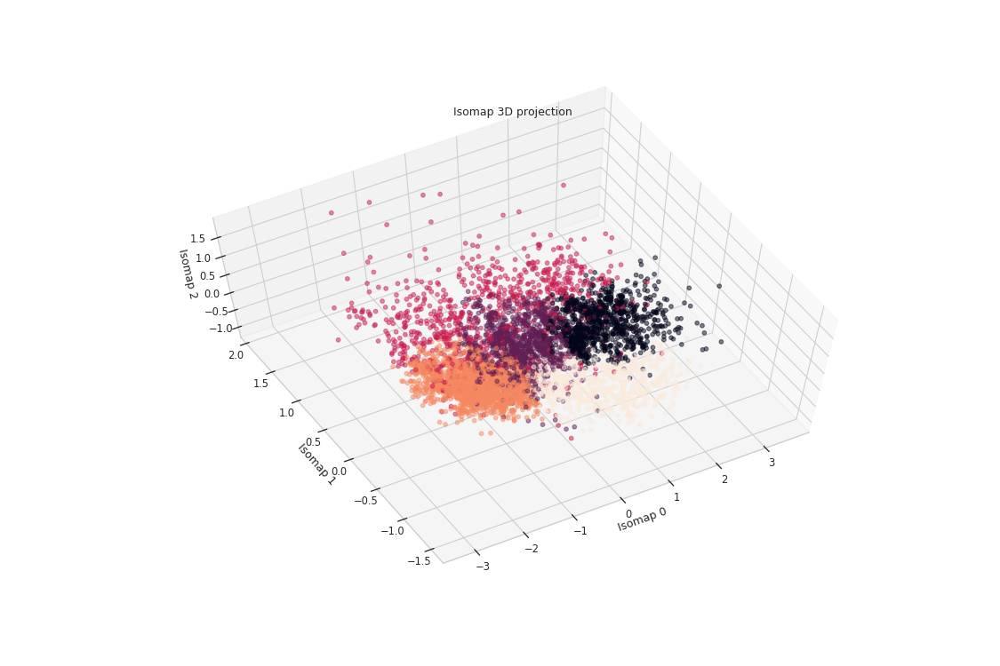

3D Args: {'n_neighbors': 50, 'n_components': 3, 'max_iter': 1000, 'n_jobs': -1}


In [330]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_isomap_clustering = FIGURES_ADDITIONAL_PATH + 'isomap_clustering'
_ = viz_Isomap(X, isomap_clusters, filename = filename_isomap_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:155: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


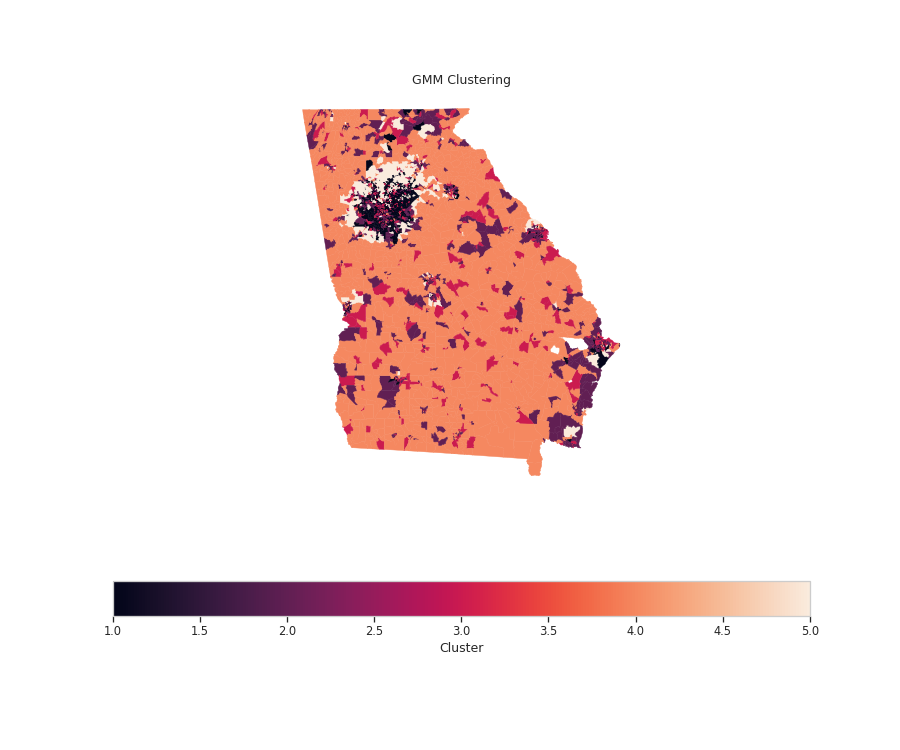

In [326]:
# #Viz clustering on the map
filename_isomap_clustering_map = FIGURES_ADDITIONAL_PATH + 'isomap_clustering_map'
viz_cluster_map(isomap_clusters, index_X, filename = filename_isomap_clustering_map)

In [328]:
# #Viz on the emb
# #CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
# filename_isomap_clustering = FIGURES_ADDITIONAL_PATH + 'isomap_clustering_SE_viz'
# _ = viz_SE(X_isomap_df.values, isomap_clusters, filename = filename_isomap_clustering, alpha = 0.5)

In [331]:
#last, SE
#Now Isomap
SE_means = pd.DataFrame(SE_means, columns = ['V'+str(i+1) for i in range(SE_means.shape[1])])
# SE_means

In [332]:
N_TIMESERIES = 5
FIGURES_ADDITIONAL_PATH = 'exploratory/covid/interpretability/GA/'
closest_to_mean_samples, closest_to_mean_block_ids = find_closest_time_series(X_SE_df, SE_means, covid_ga_, n = N_TIMESERIES)
closest_to_mean_samples['V4'].shape

(5, 117)

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


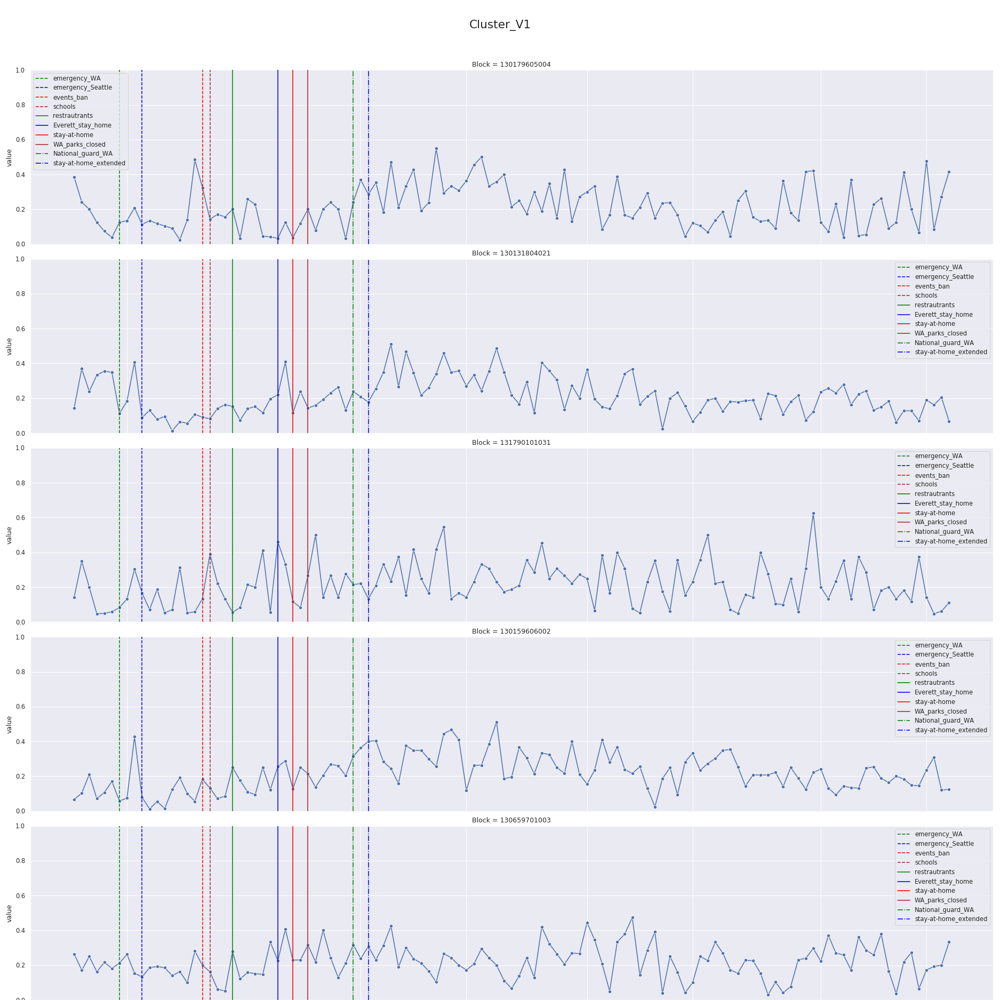

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


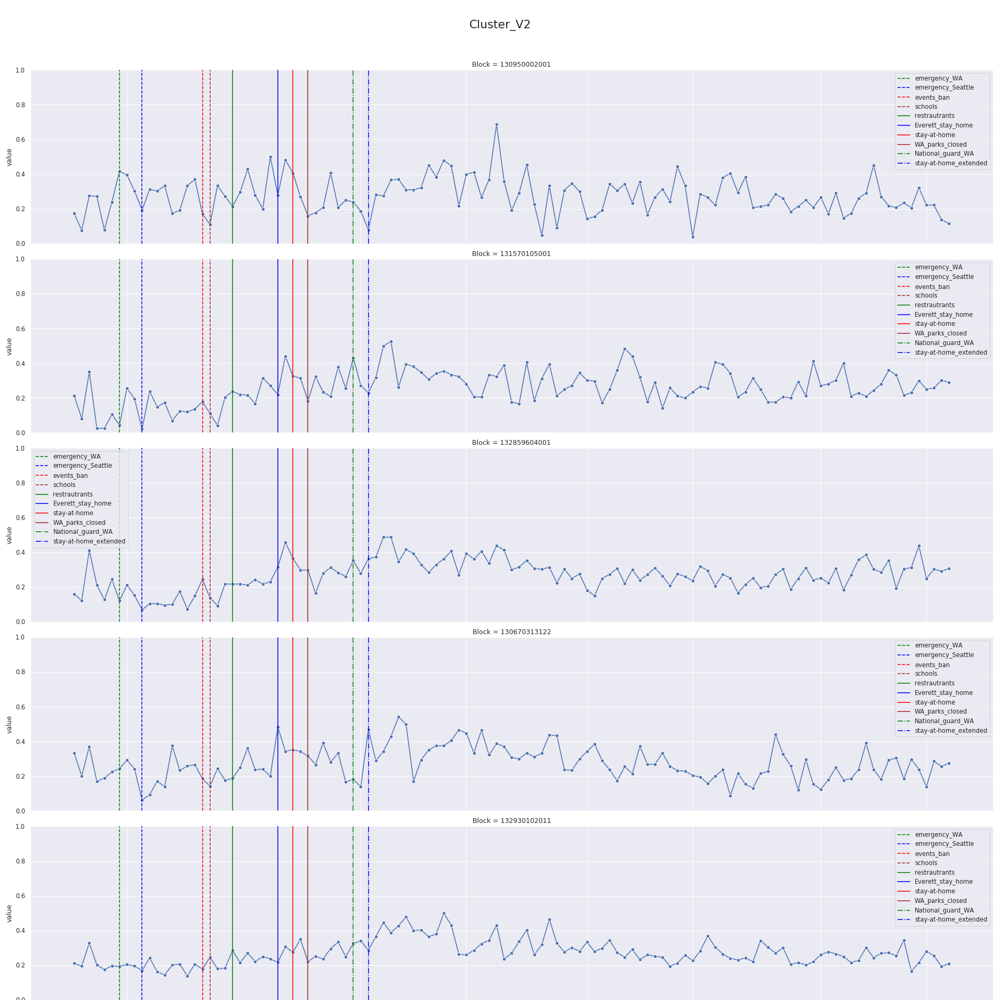

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


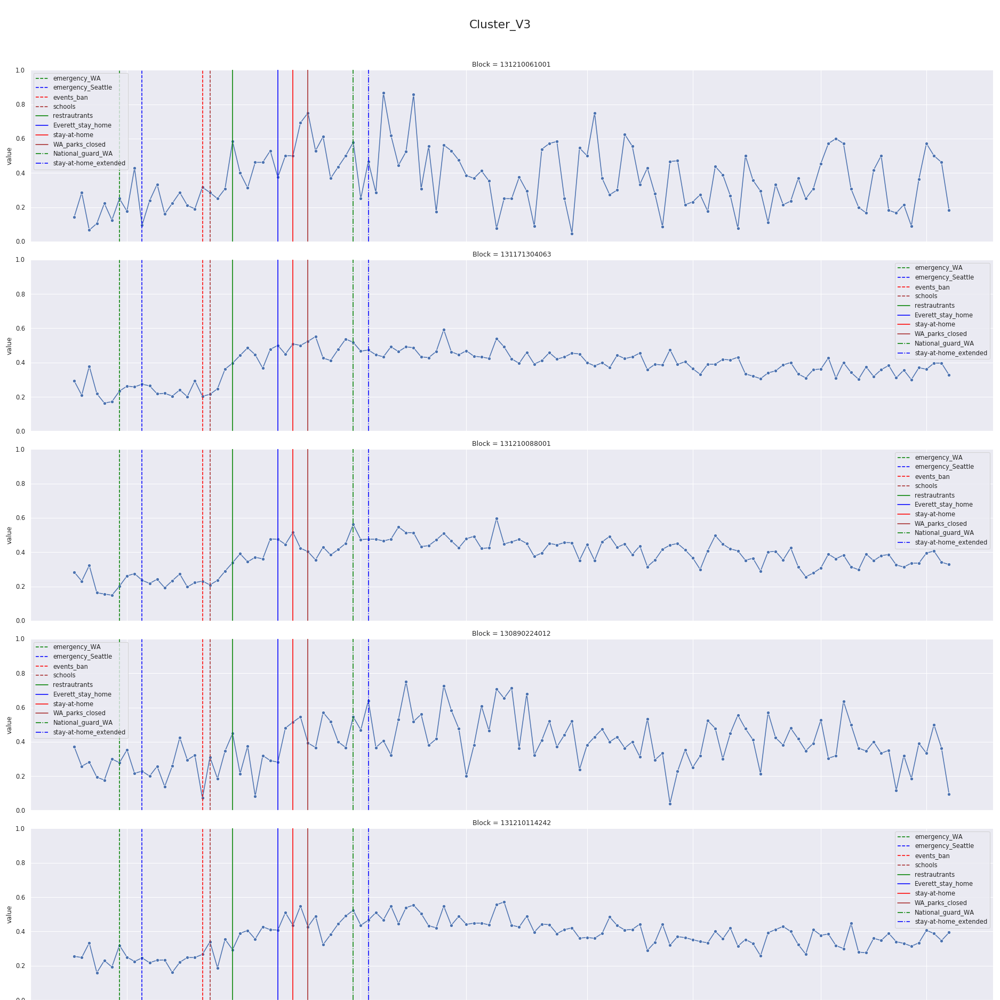

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


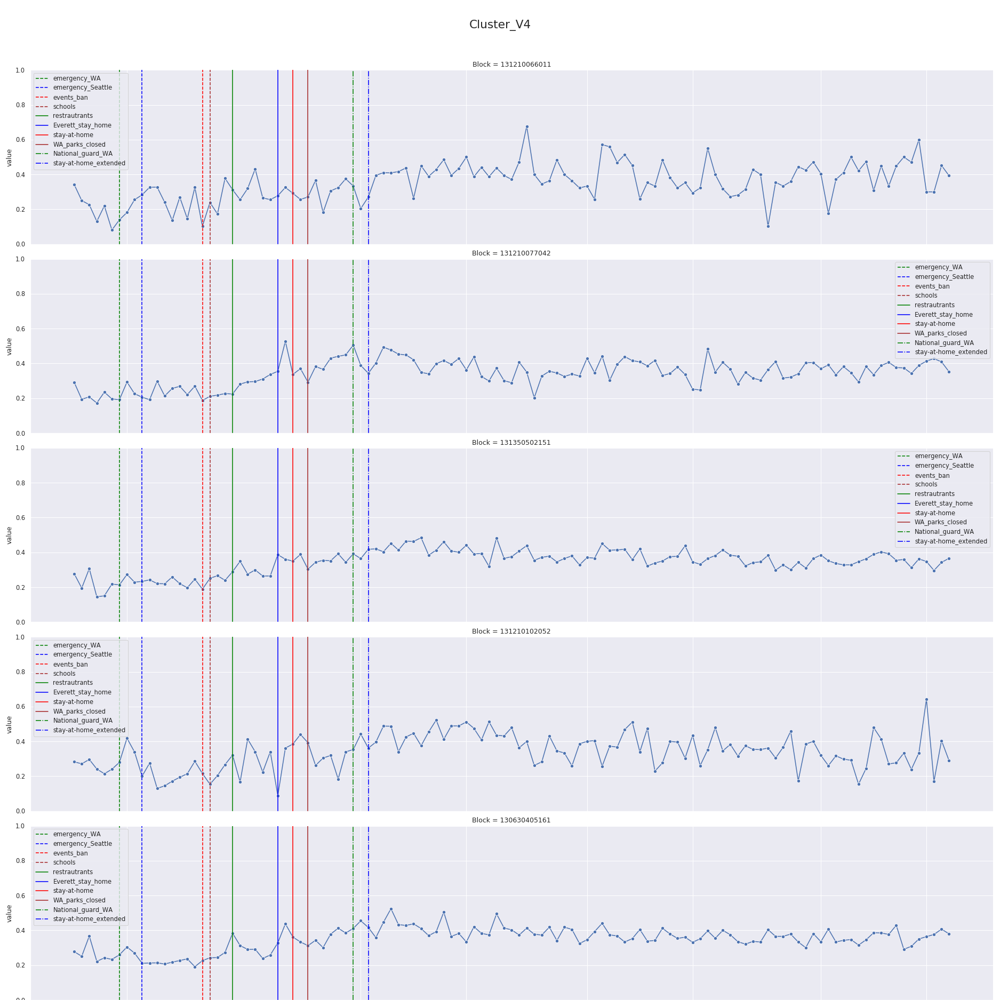

/home/rlevin/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<IPython.core.display.Javascript object>


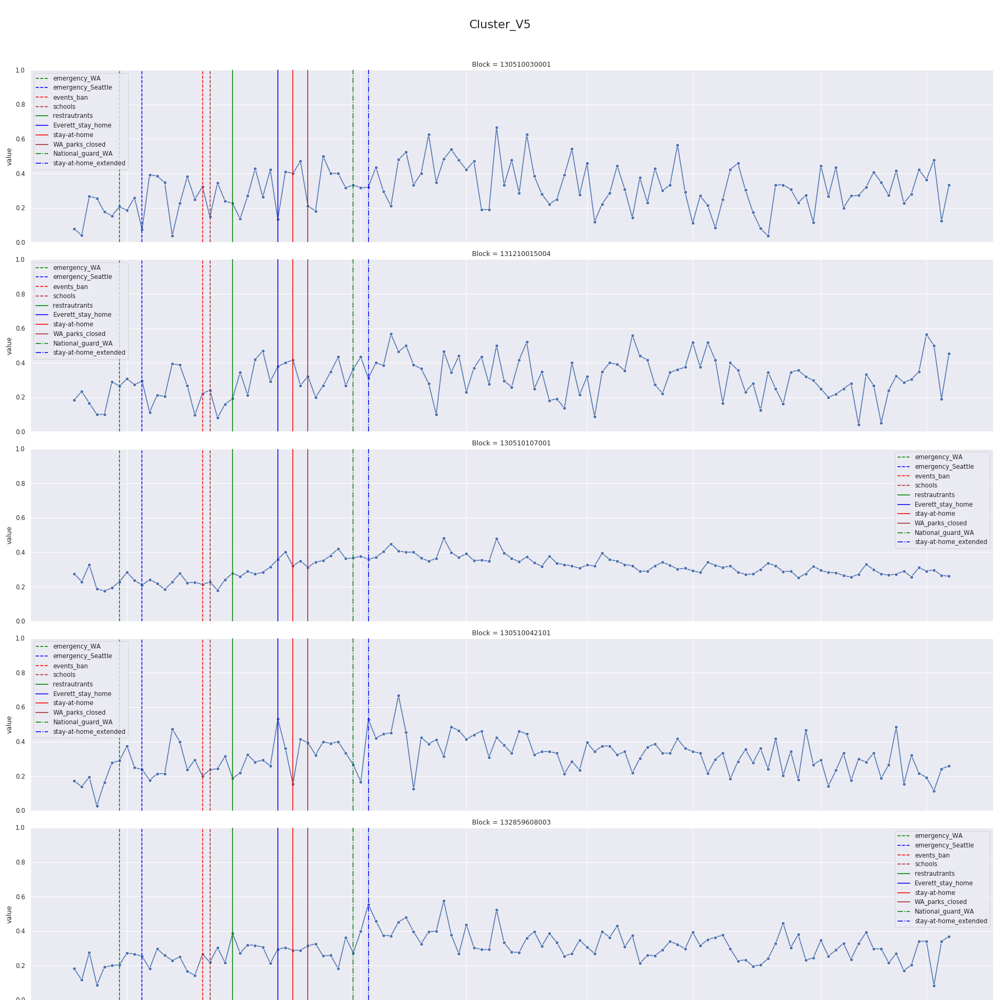

In [333]:
#Look at the closest time series
for cluster in SE_means.columns:   
    filename_ts_plot = FIGURES_ADDITIONAL_PATH + 'SE_closest_time_series_'+cluster+'.png'
    plot_time_series(closest_to_mean_samples[cluster], 'Cluster_'+cluster, filename = filename_ts_plot)

/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:59: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


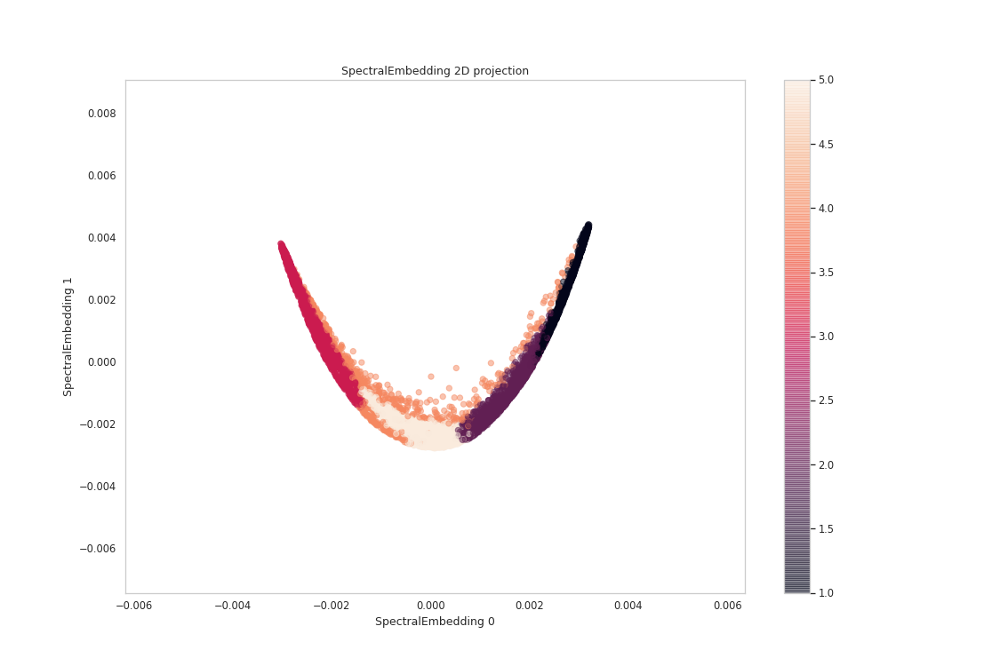

2D Args: {'n_neighbors': 50, 'n_components': 2, 'n_jobs': -1}


/mnt/c/Users/rlevin/Documents/notebooks/datadrivenmethodsforgemspoliocovid/src/dim_red_viz.py:81: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15,10))


<IPython.core.display.Javascript object>


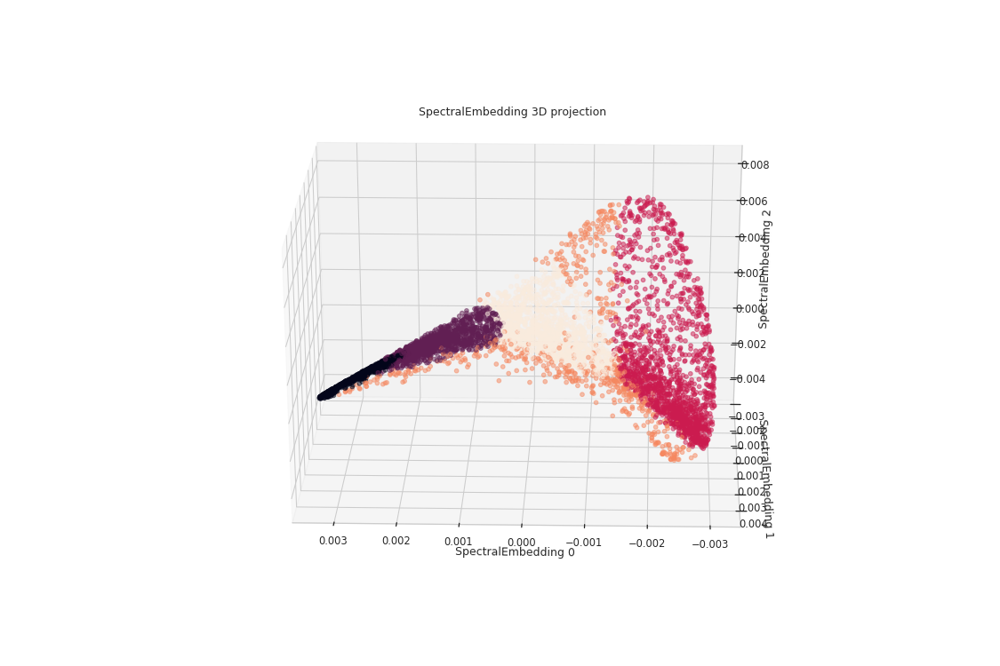

3D Args: {'n_neighbors': 50, 'n_components': 3, 'n_jobs': -1}


In [334]:
#Viz on the emb
#CHECK DISCREPANCY BETWEEN X AND X_DF_LLE
filename_SE_clustering = FIGURES_ADDITIONAL_PATH + 'SE_clustering'
_ = viz_SE(X, SE_clusters, filename = filename_SE_clustering, alpha = 0.5)

/home/rlevin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:155: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


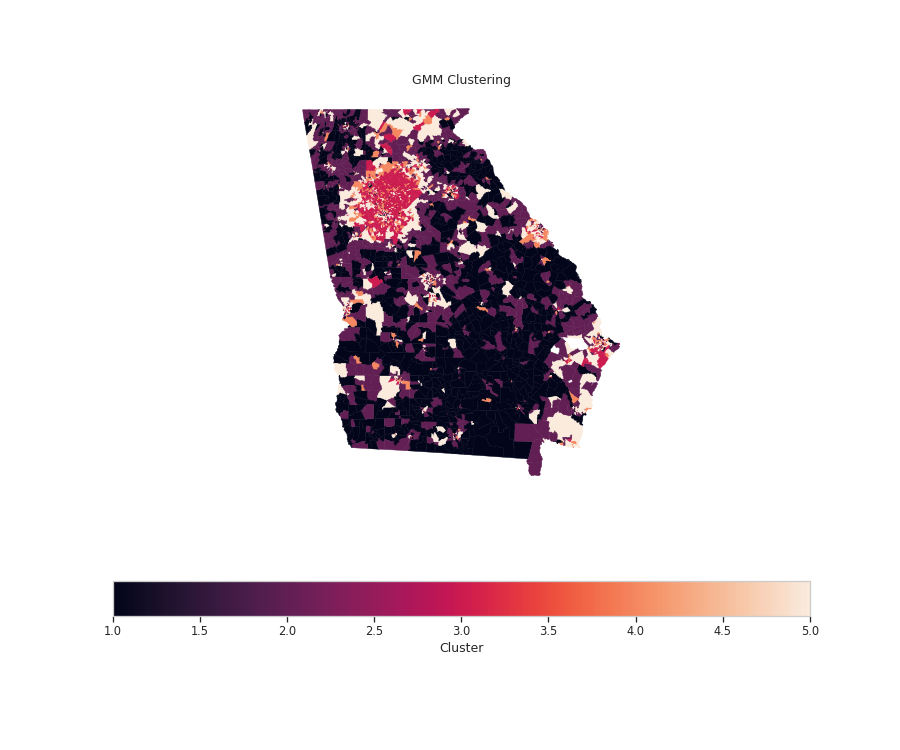

In [335]:
# #Viz clustering on the map
filename_SE_clustering_map = FIGURES_ADDITIONAL_PATH + 'SE_clustering_map'
viz_cluster_map(SE_clusters, index_X, filename = filename_SE_clustering_map)

In [336]:
ga_shape = gpd.read_file('/home/rlevin/notebooks/notebooks/datadrivenmethodsforgemspoliocovid/data/external/georgia_blockgroup_shape/tl_2017_13_bg.shp')

In [337]:
ga_shape.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,13,089,021202,2,130890212022,Block Group 2,G5030,S,2213448,79182,+33.9151116,-084.3275107,"POLYGON ((-84.33827 33.91816, -84.33799 33.918..."
1,13,089,021204,1,130890212041,Block Group 1,G5030,S,412353,0,+33.8884823,-084.2911951,"POLYGON ((-84.29465 33.89111, -84.29463 33.891..."
2,13,089,021208,2,130890212082,Block Group 2,G5030,S,1124763,0,+33.9104582,-084.3053062,"POLYGON ((-84.31090 33.91140, -84.31067 33.911..."
3,13,021,013102,3,130210131023,Block Group 3,G5030,S,1005267,0,+32.7925292,-083.6973617,"POLYGON ((-83.70755 32.79474, -83.70754 32.794..."
4,13,021,013102,4,130210131024,Block Group 4,G5030,S,807521,0,+32.7897449,-083.7020433,"POLYGON ((-83.70770 32.78788, -83.70768 32.788..."


In [339]:
# ga_shape.TRACTCE.value_counts()